<a href="https://colab.research.google.com/github/mahalasanayak/PlantDisease/blob/main/plant_of_final_html_dense121_py.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
import matplotlib.pyplot as plt
import os
import pickle
from collections import defaultdict

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from keras.applications.densenet import DenseNet121
from keras.applications.densenet import preprocess_input
from keras.optimizers import Adam, SGD
from keras.models import Model, load_model
from keras.layers import *
from sklearn.model_selection import train_test_split
from keras.callbacks import *

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import cv2
import os
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
from keras.models import Model,Sequential, Input, load_model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization, AveragePooling2D, GlobalAveragePooling2D
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

In [ ]:
disease_types = ['Pepper__bell___Bacterial_spot','Pepper__bell___healthy','Potato___Early_blight','Potato___healthy','Tomato_Bacterial_spot','Tomato_Late_blight','Tomato_Septoria_leaf_spot','Tomato__Tomato_YellowLeaf__Curl_Virus','Tomato_healthy']
data_dir = '/content/drive/MyDrive/archive/PlantVillage'
train_dir = os.path.join(data_dir)

In [ ]:
train_data = []
for defects_id, sp in enumerate(disease_types):
    for file in os.listdir(os.path.join(train_dir, sp)):
        train_data.append(['{}/{}'.format(sp, file), defects_id, sp])
        
train = pd.DataFrame(train_data, columns=['File', 'DiseaseID','Disease Type'])
train.tail()

,File,DiseaseID,Disease Type
14229,Tomato_healthy/5dd2a498-7eff-4da7-9c0f-8c39410...,8,Tomato_healthy
14230,Tomato_healthy/5dbc2db5-5bb2-4a3c-9a90-d2228c1...,8,Tomato_healthy
14231,Tomato_healthy/5c057128-2d09-4757-8e44-520fb30...,8,Tomato_healthy
14232,Tomato_healthy/5d49f9d4-e27e-4220-933a-3bef2f4...,8,Tomato_healthy
14233,Tomato_healthy/5b7b9824-0cdd-4c67-9377-136a061...,8,Tomato_healthy


In [ ]:
# Randomize the order of training set
SEED = 42
train = train.sample(frac=1, random_state=SEED) 
train.index = np.arange(len(train)) # Reset indices
train.head()

,File,DiseaseID,Disease Type
0,Tomato_Septoria_leaf_spot/e55e5031-3f13-4784-b...,6,Tomato_Septoria_leaf_spot
1,Tomato_healthy/36d4756b-afff-40cb-ac7f-598eda5...,8,Tomato_healthy
2,Tomato_Bacterial_spot/ae59ca2a-8b8f-490e-af40-...,4,Tomato_Bacterial_spot
3,Tomato__Tomato_YellowLeaf__Curl_Virus/4d9ea47e...,7,Tomato__Tomato_YellowLeaf__Curl_Virus
4,Tomato_healthy/5630c5b1-a956-4a34-879a-eb1cb89...,8,Tomato_healthy


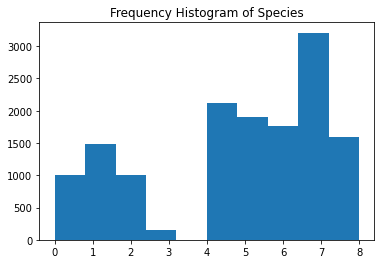

<Figure size 864x864 with 0 Axes>

In [ ]:
# Plot a histogram
plt.hist(train['DiseaseID'])
plt.title('Frequency Histogram of Species')
plt.figure(figsize=(12, 12))
plt.show()

In [ ]:
IMAGE_SIZE = 64

def read_image(filepath):
    return cv2.imread(os.path.join(data_dir, filepath)) # Loading a color image is the default flag
# Resize image to target size
def resize_image(image, image_size):
    return cv2.resize(image.copy(), image_size, interpolation=cv2.INTER_AREA)

In [ ]:
X_train = np.zeros((train.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3))
for i, file in tqdm(enumerate(train['File'].values)):
    image = read_image(file)
    if image is not None:
        X_train[i] = resize_image(image, (IMAGE_SIZE, IMAGE_SIZE))
# Normalize the data
X_Train = X_train / 255.
print('Train Shape: {}'.format(X_Train.shape))

14234it [55:12,  4.30it/s]


Train Shape: (14234, 64, 64, 3)


In [ ]:
Y_train = train['DiseaseID'].values
Y_train = to_categorical(Y_train, num_classes=15)

In [ ]:
BATCH_SIZE = 64

# Split the train and validation sets 
X_train, X_val, Y_train, Y_val = train_test_split(X_Train, Y_train, test_size=0.2, random_state=SEED)

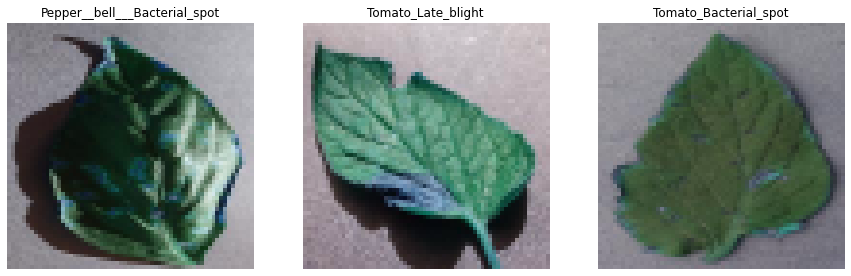

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 15))
for i in range(3):
    ax[i].set_axis_off()
    ax[i].imshow(X_train[i])
    ax[i].set_title(disease_types[np.argmax(Y_train[i])])

In [ ]:
EPOCHS = 40
SIZE=64
N_ch=3

In [ ]:
def build_densenet():
    densenet = DenseNet121(weights='imagenet', include_top=False)

    input = Input(shape=(SIZE, SIZE, N_ch))
    x = Conv2D(3, (3, 3), padding='same')(input)
    
    x = densenet(x)
    
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)

    # multi output
    output = Dense(15,activation = 'softmax', name='root')(x)
 

    # model
    model = Model(input,output)
    
    optimizer = Adam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=0.1, decay=0.0)
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    model.summary()
    
    return model

In [ ]:
model = build_densenet()
annealer = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=5, verbose=1, min_lr=1e-3)
checkpoint = ModelCheckpoint('model.h5', verbose=1, save_best_only=True)
# Generates batches of image data with data augmentation
datagen = ImageDataGenerator(rotation_range=360, # Degree range for random rotations
                        width_shift_range=0.2, # Range for random horizontal shifts
                        height_shift_range=0.2, # Range for random vertical shifts
                        zoom_range=0.2, # Range for random zoom
                        horizontal_flip=True, # Randomly flip inputs horizontally
                        vertical_flip=True) # Randomly flip inputs vertically

datagen.fit(X_train)
# Fits the model on batches with real-time data augmentation
hist = model.fit_generator(datagen.flow(X_train, Y_train, batch_size=BATCH_SIZE),
               steps_per_epoch=X_train.shape[0] // BATCH_SIZE,
               epochs=EPOCHS,
               verbose=2,
               callbacks=[annealer, checkpoint],
               validation_data=(X_val, Y_val))

29097984/29084464 [==============================] - 0s 0us/step


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 64, 64, 3)         84        
_________________________________________________________________
densenet121 (Functional)     (None, None, None, 1024)  7037504   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1024)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1024)              4096      
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               262400

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/40
177/177 - 108s - loss: 2.3964 - accuracy: 0.3813 - val_loss: 1.4265 - val_accuracy: 0.6207

Epoch 00001: val_loss improved from inf to 1.42650, saving model to model.h5
Epoch 2/40
177/177 - 22s - loss: 0.7706 - accuracy: 0.7725 - val_loss: 0.6709 - val_accuracy: 0.8089

Epoch 00002: val_loss improved from 1.42650 to 0.67090, saving model to model.h5
Epoch 3/40
177/177 - 22s - loss: 0.3991 - accuracy: 0.8730 - val_loss: 0.8072 - val_accuracy: 0.7938

Epoch 00003: val_loss did not improve from 0.67090
Epoch 4/40
177/177 - 23s - loss: 0.2542 - accuracy: 0.9225 - val_loss: 0.2560 - val_accuracy: 0.9203

Epoch 00004: val_loss improved from 0.67090 to 0.25598, saving model to model.h5
Epoch 5/40
177/177 - 23s - loss: 0.1884 - accuracy: 0.9414 - val_loss: 0.4588 - val_accuracy: 0.8641

Epoch 00005: val_loss did not improve from 0.25598
Epoch 6/40
177/177 - 23s - loss: 0.1560 - accuracy: 0.9492 - val_loss: 0.2967 - val_accuracy: 0.9111

Epoch 00006: val_loss did not improve from 0.2

In [ ]:
#model = load_model('../output/kaggle/working/model.h5')
final_loss, final_accuracy = model.evaluate(X_val, Y_val)
print('Final Loss: {}, Final Accuracy: {}'.format(final_loss, final_accuracy))

89/89 [==============================] - 2s 22ms/step - loss: 0.0482 - accuracy: 0.9852
Final Loss: 0.048239029943943024, Final Accuracy: 0.9852476119995117


Text(0.5, 144.41374999999996, 'Predicted')

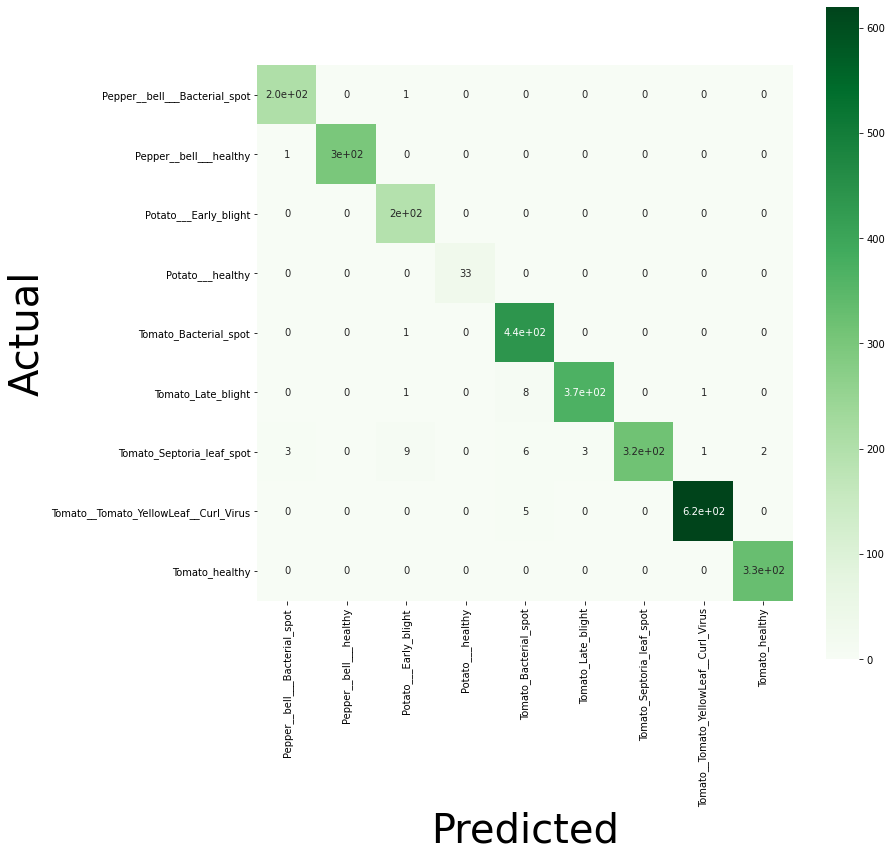

In [ ]:
Y_pred = model.predict(X_val)

Y_pred = np.argmax(Y_pred, axis=1)
Y_true = np.argmax(Y_val, axis=1)

cm = confusion_matrix(Y_true, Y_pred)
plt.figure(figsize=(12, 12))
ax = sns.heatmap(cm, cmap=plt.cm.Greens, annot=True, square=True, xticklabels=disease_types, yticklabels=disease_types)
ax.set_ylabel('Actual', fontsize=40)
ax.set_xlabel('Predicted', fontsize=40)

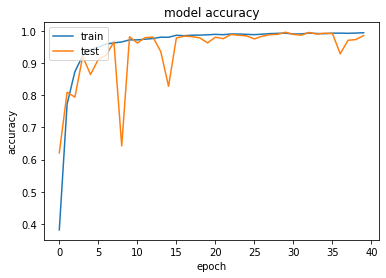

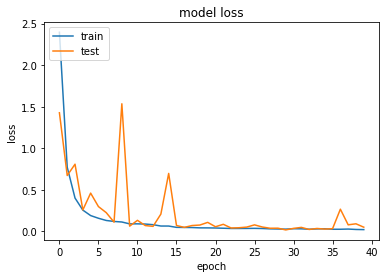

In [ ]:
# accuracy plot 
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# loss plot
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
!pip install flask_ngrok

In [ ]:
from flask import *
from flask_ngrok import run_with_ngrok
from skimage import io
from keras.preprocessing import image

In [ ]:
app=Flask(__name__)

In [ ]:
def classify_image(filename):
  img = image.load_img(filename, grayscale=False, target_size=(64, 64))
  print(filename)
  show_img=image.load_img(filename, grayscale=False, target_size=(200, 200))
  disease_class = ['Pepper__bell___Bacterial_spot','Pepper__bell___healthy','Potato___Early_blight','Potato___healthy','Tomato_Bacterial_spot','Tomato_Late_blight','Tomato_Septoria_leaf_spot','Tomato__Tomato_YellowLeaf__Curl_Virus','Tomato_healthy']
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis = 0)
  #x = np.array(x, 'float32')
  x /= 255

  custom = model.predict(x)
  print(custom[0])



    #x = x.reshape([64, 64]);

    #plt.gray()
  plt.imshow(show_img)
  plt.show()

  a=custom[0]
  ind=np.argmax(a)
        
  print('Prediction:',disease_class[ind])
  return('Prediction:',disease_class[ind])






In [ ]:
@app.route('/')
def home():
  return render_template('index.html')


@app.route('/result.html',methods=['POST','GET'])
def classify():
  if request.method =='POST':
    filen=request.files['img']
    filen.save(os.path.join("static",filen.filename))
    result1, result2 =classify_image(os.path.join("static",filen.filename))
    return render_template('result.html',name1=result1,name2=result2, name3=filen.filename)


 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://dd9c6533ea50.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


127.0.0.1 - - [16/Jul/2021 15:54:47] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:54:47] "GET /static/leaves.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:54:47] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:54:48] "GET /static/css/icon.png HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:54:48] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:54:50] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:54:50] "GET /static/leaves.jpg HTTP/1.1" 200 -


static/00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132.JPG
[6.5352081e-04 2.1374372e-01 7.6747197e-01 1.4623437e-02 3.0795668e-08
 1.5022928e-06 9.4554589e-06 2.6451477e-09 2.5901943e-03 7.3774958e-05
 1.0290104e-04 1.0962285e-04 1.9340481e-04 2.1419498e-04 2.1231113e-04]


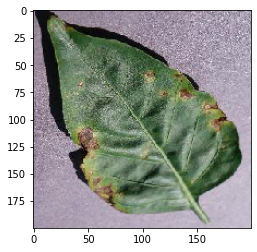

127.0.0.1 - - [16/Jul/2021 15:55:10] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 15:55:11] "GET /static/00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot%203132.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:55:11] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:55:11] "GET /favicon.ico HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:55:15] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:55:15] "GET /static/css/style.css HTTP/1.1" 404 -


static/00d8f10f-5038-4e0f-bb58-0b885ddc0cc5___RS_Early.B 8722.JPG
[1.05573426e-08 1.98210026e-09 9.98539448e-01 1.45161478e-03
 4.14217237e-11 3.87205574e-08 8.75220674e-10 3.80421146e-11
 2.41349994e-06 2.14674742e-07 5.23538745e-07 9.91062507e-07
 4.20386687e-06 8.38234939e-08 4.77531955e-07]


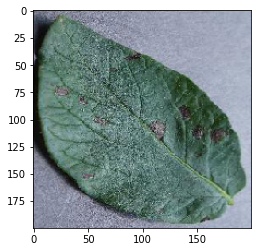

127.0.0.1 - - [16/Jul/2021 15:55:29] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 15:55:29] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:55:29] "GET /static/00d8f10f-5038-4e0f-bb58-0b885ddc0cc5___RS_Early.B%208722.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:55:50] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:55:50] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a8a68ee-f587-4dea-beec-79d02e7d3fa4___RS_Early.B 8461.JPG
[2.0965809e-08 4.1758944e-05 9.5798457e-01 4.1646294e-02 2.1157780e-09
 2.1221852e-06 2.2477675e-08 1.1124577e-09 1.2871759e-05 3.0400029e-06
 4.9706136e-06 2.1568055e-06 2.6335518e-04 2.5345876e-06 3.6359183e-05]


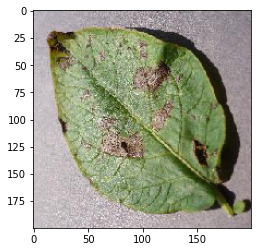

127.0.0.1 - - [16/Jul/2021 15:56:00] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 15:56:01] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:56:01] "GET /static/0a8a68ee-f587-4dea-beec-79d02e7d3fa4___RS_Early.B%208461.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:56:32] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:56:32] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a47f32c-1724-4c8d-bfe4-986cedd3587b___RS_Early.B 8001.JPG
[1.0790256e-08 9.6032643e-08 6.3703306e-02 9.3626773e-01 9.0861589e-11
 5.1133856e-08 2.7897284e-09 3.2596120e-10 6.5885018e-07 5.7192347e-07
 1.3697454e-06 1.4740826e-06 2.2238139e-05 4.9627960e-07 1.9973802e-06]


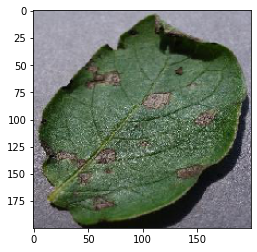

127.0.0.1 - - [16/Jul/2021 15:56:39] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 15:56:40] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:56:40] "GET /static/0a47f32c-1724-4c8d-bfe4-986cedd3587b___RS_Early.B%208001.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:56:55] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:56:55] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a0744dc-8486-4fbb-a44b-4d63e6db6197___RS_Early.B 7575.JPG
[8.6591564e-07 3.6410667e-05 2.5742629e-04 7.3071501e-06 5.8016519e-07
 9.9946612e-01 1.5198786e-04 1.1786306e-06 5.3717263e-06 1.2381965e-05
 3.8368953e-06 7.6550377e-06 9.3153676e-06 2.5312596e-05 1.4163644e-05]


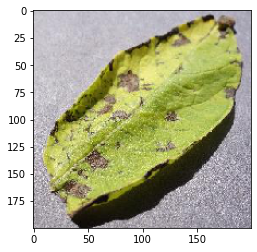

127.0.0.1 - - [16/Jul/2021 15:57:03] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 15:57:03] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:57:03] "GET /static/0a0744dc-8486-4fbb-a44b-4d63e6db6197___RS_Early.B%207575.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:57:14] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:57:14] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a6983a5-895e-4e68-9edb-88adf79211e9___RS_Early.B 9072.JPG
[2.2216147e-04 5.3631263e-03 2.5013569e-01 3.8842529e-02 3.4742818e-05
 6.9398195e-01 4.3355487e-04 1.5277309e-04 1.1755187e-03 6.6305487e-04
 5.3180190e-04 4.4097932e-04 3.1714453e-03 4.4104937e-04 4.4096713e-03]


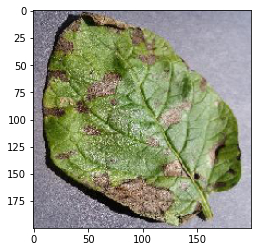

127.0.0.1 - - [16/Jul/2021 15:57:22] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 15:57:22] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:57:22] "GET /static/0a6983a5-895e-4e68-9edb-88adf79211e9___RS_Early.B%209072.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:57:28] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:57:28] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a79700b-f834-41f5-ae51-6ceda6f67a48___RS_Early.B 8951.JPG
[2.3734214e-05 8.0507074e-04 8.9845508e-01 8.9753434e-02 8.4187914e-06
 5.1778774e-03 2.2624785e-05 4.0175339e-05 7.4036384e-04 1.3006634e-04
 3.4094954e-04 2.3495550e-04 2.3016266e-03 6.8289017e-05 1.8974501e-03]


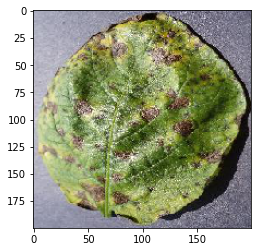

127.0.0.1 - - [16/Jul/2021 15:57:52] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 15:57:52] "GET /static/0a79700b-f834-41f5-ae51-6ceda6f67a48___RS_Early.B%208951.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:57:53] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:57:57] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:57:57] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ad3ba53-f01b-403b-a99d-5991eed85045___RS_Early.B 7600.JPG
[1.0814629e-06 5.0655999e-06 5.1013444e-02 9.4886810e-01 1.2860753e-08
 1.4505417e-05 2.4433029e-07 1.0174048e-07 3.8242479e-06 5.7265820e-06
 1.1463006e-05 9.3164244e-06 4.7015714e-05 7.7316490e-06 1.2419217e-05]


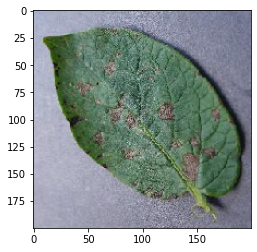

127.0.0.1 - - [16/Jul/2021 15:58:05] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 15:58:06] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:58:06] "GET /static/0ad3ba53-f01b-403b-a99d-5991eed85045___RS_Early.B%207600.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:58:11] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:58:12] "GET /static/css/style.css HTTP/1.1" 404 -


static/0bbb8bce-2020-416b-8bd6-c160c2db9921___RS_Early.B 8386.JPG
[3.9629475e-10 1.6418468e-06 6.7907351e-01 3.2089737e-01 1.7185470e-11
 6.2366077e-08 8.2588614e-10 2.7524864e-11 1.0900757e-06 5.0612948e-07
 5.6798149e-07 4.5826440e-07 2.1042733e-05 2.4543209e-07 3.5149440e-06]


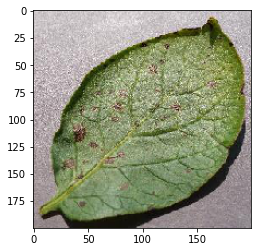

127.0.0.1 - - [16/Jul/2021 15:58:19] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 15:58:20] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:58:20] "GET /static/0bbb8bce-2020-416b-8bd6-c160c2db9921___RS_Early.B%208386.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:58:22] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:58:23] "GET /static/css/style.css HTTP/1.1" 404 -


static/0d2e2971-f1c9-4278-b35c-91dd8a22a64d___RS_Early.B 7581.JPG
[4.5336859e-05 7.0758868e-04 1.5356794e-03 8.2878585e-05 5.5967184e-06
 9.9514836e-01 7.3645683e-04 5.8238697e-06 8.5804448e-04 1.4771758e-04
 5.0999035e-05 8.9865323e-05 9.9922414e-05 1.6297588e-04 3.2289975e-04]


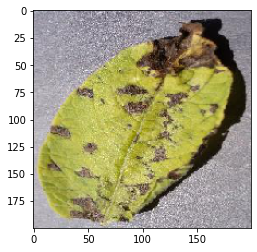

127.0.0.1 - - [16/Jul/2021 15:59:40] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 15:59:40] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 15:59:40] "GET /static/0d2e2971-f1c9-4278-b35c-91dd8a22a64d___RS_Early.B%207581.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:59:43] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 15:59:43] "GET /static/css/style.css HTTP/1.1" 404 -


static/0bbb8bce-2020-416b-8bd6-c160c2db9921___RS_Early.B 8386.JPG
[3.9629475e-10 1.6418468e-06 6.7907351e-01 3.2089737e-01 1.7185470e-11
 6.2366077e-08 8.2588614e-10 2.7524864e-11 1.0900757e-06 5.0612948e-07
 5.6798149e-07 4.5826440e-07 2.1042733e-05 2.4543209e-07 3.5149440e-06]


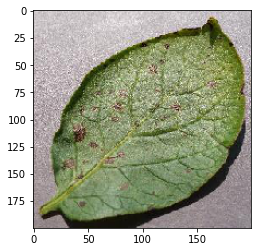

127.0.0.1 - - [16/Jul/2021 15:59:57] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 15:59:57] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:00:00] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:00:00] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:00:02] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:00:03] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:00:03] "GET /static/leaves.jpg HTTP/1.1" 200 -


static/0c4f6f72-c7a2-42e1-9671-41ab3bf37fe7___RS_Early.B 6752.JPG
[6.8130785e-06 1.0688901e-04 4.1620106e-01 5.7478154e-01 3.9734732e-06
 3.0094618e-03 3.5884656e-05 8.6939144e-06 1.3745450e-03 1.8166834e-04
 4.6743933e-04 1.8709006e-04 1.7709236e-03 1.7337524e-04 1.6906572e-03]


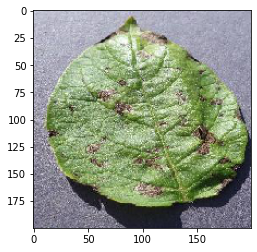

127.0.0.1 - - [16/Jul/2021 16:00:09] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:00:10] "GET /static/0c4f6f72-c7a2-42e1-9671-41ab3bf37fe7___RS_Early.B%206752.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:00:10] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:00:17] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:00:18] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c5b14d9-8b1c-4c39-bb23-1835b5760caa___RS_Early.B 7937.JPG
[2.14295381e-09 1.02469514e-07 9.96105075e-01 3.88300978e-03
 8.47312914e-11 9.59041984e-08 1.41105350e-09 9.68069860e-11
 8.06394155e-07 2.88577809e-07 7.18236151e-07 4.89406546e-07
 8.34966613e-06 7.24779525e-08 1.00069997e-06]


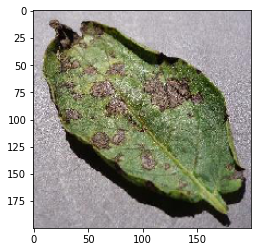

127.0.0.1 - - [16/Jul/2021 16:00:29] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:00:29] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:00:29] "GET /static/0c5b14d9-8b1c-4c39-bb23-1835b5760caa___RS_Early.B%207937.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:00:32] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:00:33] "GET /static/css/style.css HTTP/1.1" 404 -


static/0caf6a39-3f5f-4201-a4d7-3ea35fdf1303___RS_Early.B 6762.JPG
[1.1223481e-04 7.5380499e-03 8.1467527e-01 8.9674637e-02 1.2888084e-04
 6.5717012e-02 7.8823348e-04 5.3072126e-05 3.6939813e-03 7.7529659e-04
 1.1087863e-03 4.4979589e-04 8.4681036e-03 4.0596555e-04 6.4106826e-03]


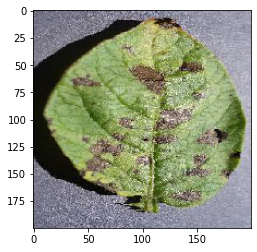

127.0.0.1 - - [16/Jul/2021 16:03:04] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:03:04] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:03:04] "GET /static/0caf6a39-3f5f-4201-a4d7-3ea35fdf1303___RS_Early.B%206762.JPG HTTP/1.1" 200 -


static/00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864.JPG
[4.9574957e-09 3.1320540e-06 5.0776940e-05 9.9989021e-01 1.2047766e-10
 1.6927338e-08 3.0916258e-08 1.4166531e-09 4.5822246e-05 2.2262273e-07
 8.2317842e-07 3.1391724e-07 4.8337392e-06 6.2342559e-07 3.2260104e-06]


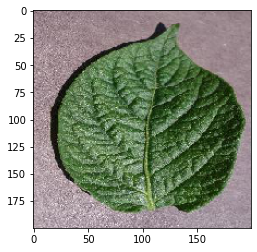

127.0.0.1 - - [16/Jul/2021 16:06:02] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:06:02] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:06:02] "GET /static/00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL%201864.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:06:23] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:06:23] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b3e5032-8ae8-49ac-8157-a1cac3df01dd___RS_HL 1817.JPG
[4.6414714e-10 1.1844296e-06 6.9339676e-06 9.9999094e-01 1.0887665e-11
 2.5302166e-08 4.1988644e-09 1.9577465e-10 1.2716306e-07 2.0941693e-08
 5.3055679e-08 3.3443420e-08 4.6834532e-07 8.6279968e-08 1.8385884e-07]


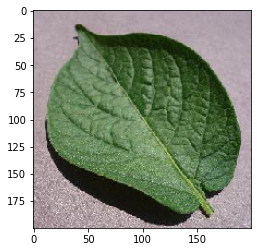

127.0.0.1 - - [16/Jul/2021 16:06:30] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:06:31] "GET /static/0b3e5032-8ae8-49ac-8157-a1cac3df01dd___RS_HL%201817.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:06:31] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:06:43] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:06:43] "GET /static/css/style.css HTTP/1.1" 404 -


static/0be9d721-82f5-42c3-b535-7494afe01dbe___RS_HL 1814.JPG
[6.6407901e-09 2.2409226e-06 2.3514341e-04 9.9974567e-01 1.3237540e-10
 2.1472631e-07 2.2524853e-07 1.8670285e-09 4.8714346e-06 1.6592415e-07
 1.2942937e-06 4.8580654e-07 6.1711153e-06 1.1195636e-06 2.3352811e-06]


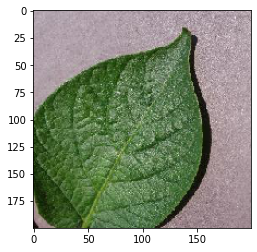

127.0.0.1 - - [16/Jul/2021 16:06:51] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:06:51] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:06:51] "GET /static/0be9d721-82f5-42c3-b535-7494afe01dbe___RS_HL%201814.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:07:00] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:07:01] "GET /static/css/style.css HTTP/1.1" 404 -


static/0f4ebc5a-d646-436a-919d-961342997cde___RS_HL 4183.JPG
[1.2258309e-07 1.1430893e-05 4.3010998e-05 9.9986792e-01 8.9434762e-09
 2.1874512e-06 9.3843428e-06 1.1968432e-07 2.6984810e-05 8.9773937e-07
 5.4792499e-06 3.2636660e-06 1.6927617e-05 3.2183946e-06 8.9710384e-06]


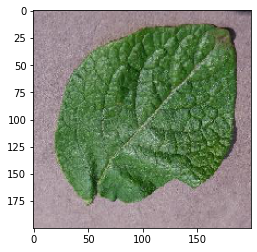

127.0.0.1 - - [16/Jul/2021 16:07:08] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:07:09] "GET /static/0f4ebc5a-d646-436a-919d-961342997cde___RS_HL%204183.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:07:14] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:07:15] "GET /static/css/style.css HTTP/1.1" 404 -


static/1a1184f8-c414-4ead-a4c4-41ae78e29a82___RS_HL 1971.JPG
[4.7687014e-09 1.9352551e-06 2.3378636e-04 9.9975032e-01 7.4418714e-11
 3.1266946e-08 3.1974736e-08 4.9080395e-10 2.6432435e-06 2.0959679e-07
 5.0117035e-07 4.0947850e-07 7.0277538e-06 3.2930393e-07 2.7339613e-06]


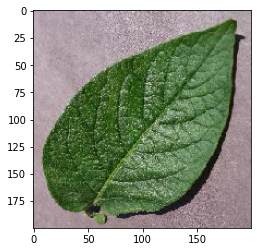

127.0.0.1 - - [16/Jul/2021 16:07:22] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:07:23] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:07:23] "GET /static/1a1184f8-c414-4ead-a4c4-41ae78e29a82___RS_HL%201971.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:07:28] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:07:28] "GET /static/css/style.css HTTP/1.1" 404 -


static/1ae826e2-5148-47bd-a44c-711ec9cc9c75___RS_HL 1954.JPG
[5.62788784e-08 2.35652587e-05 8.30743986e-04 9.98477995e-01
 2.93988700e-09 7.91818893e-05 3.66213135e-05 1.66071228e-08
 4.37905750e-04 5.06274000e-06 1.29040045e-05 3.64199173e-06
 5.53915379e-05 7.38420658e-06 2.96578055e-05]


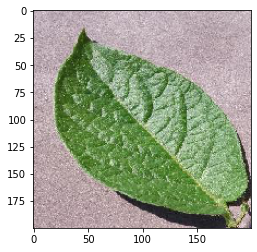

127.0.0.1 - - [16/Jul/2021 16:07:35] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:07:36] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:07:36] "GET /static/1ae826e2-5148-47bd-a44c-711ec9cc9c75___RS_HL%201954.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:07:41] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:07:42] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:07:51] "GET /static/css/style.css HTTP/1.1" 404 -


static/1b434c52-7be4-40c4-90d5-13220f1a3eba___RS_HL 5418.JPG
[1.0420279e-09 7.8673168e-07 3.5460133e-04 9.9964082e-01 5.5188812e-11
 1.5286050e-08 4.7094115e-09 2.0662212e-10 4.1990086e-07 5.1604843e-08
 2.3236146e-07 2.2960073e-07 2.0224500e-06 1.3484522e-07 5.7892078e-07]


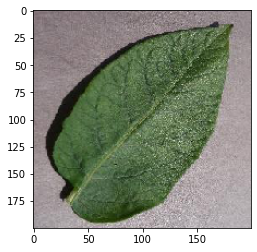

127.0.0.1 - - [16/Jul/2021 16:08:09] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:08:09] "GET /static/1b434c52-7be4-40c4-90d5-13220f1a3eba___RS_HL%205418.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:08:09] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:08:16] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:08:16] "GET /static/css/style.css HTTP/1.1" 404 -


static/00b1f292-23dd-44d4-aad3-c1ffb6a6ad5a___RS_LB 4479.JPG
[6.2056133e-06 2.6085516e-04 2.8668195e-03 8.3978009e-01 3.7674390e-06
 5.8127771e-04 7.8824046e-04 3.7164573e-05 1.5164086e-01 2.5873558e-04
 5.1683071e-04 1.8199443e-04 2.2598784e-03 3.8419617e-04 4.3303991e-04]


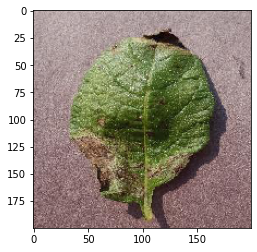

127.0.0.1 - - [16/Jul/2021 16:09:46] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:09:46] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:09:46] "GET /static/00b1f292-23dd-44d4-aad3-c1ffb6a6ad5a___RS_LB%204479.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:09:50] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:09:50] "GET /static/css/style.css HTTP/1.1" 404 -


static/0acdc2b2-0dde-4073-8542-6fca275ab974___RS_LB 4857.JPG
[3.2176362e-07 1.5447533e-05 1.5929361e-03 9.9802113e-01 4.4070372e-08
 1.0664300e-04 6.0262653e-07 1.3368656e-06 3.1101903e-05 8.0539930e-06
 1.6040116e-05 1.1963712e-05 1.3719087e-04 1.0767952e-05 4.6422512e-05]


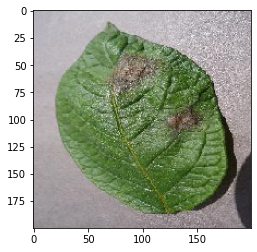

127.0.0.1 - - [16/Jul/2021 16:09:56] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:09:57] "GET /static/0acdc2b2-0dde-4073-8542-6fca275ab974___RS_LB%204857.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:09:59] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:09:59] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b2bdc8e-90fd-4bb4-bedb-485502fe8a96___RS_LB 4906.JPG
[3.5717675e-09 4.9526726e-08 5.6222469e-01 4.3765274e-01 2.4613334e-11
 1.5725442e-07 4.2408428e-09 2.9711114e-10 8.6506398e-06 7.6502079e-07
 1.5960832e-06 2.6579414e-06 1.0685044e-04 7.9736645e-07 1.0399152e-06]


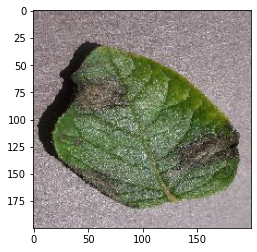

127.0.0.1 - - [16/Jul/2021 16:10:06] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:10:06] "GET /static/0b2bdc8e-90fd-4bb4-bedb-485502fe8a96___RS_LB%204906.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:10:09] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:10:09] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b092cda-db8c-489d-8c46-23ac3835310d___RS_LB 4480.JPG
[9.0489239e-06 3.3106882e-04 9.8602874e-03 6.7052668e-01 3.0893680e-06
 1.2963476e-03 6.2613602e-04 7.7034592e-06 3.1206337e-01 1.8243307e-04
 1.1069067e-03 3.6190002e-04 1.9265980e-03 7.8980182e-04 9.0860779e-04]


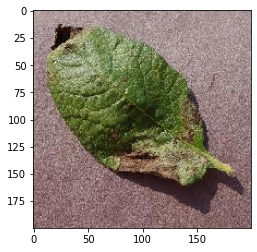

127.0.0.1 - - [16/Jul/2021 16:10:17] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:10:17] "GET /static/0b092cda-db8c-489d-8c46-23ac3835310d___RS_LB%204480.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:10:20] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:10:20] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:10:31] "GET /static/css/style.css HTTP/1.1" 404 -


static/00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132.JPG
[6.5352081e-04 2.1374372e-01 7.6747197e-01 1.4623437e-02 3.0795668e-08
 1.5022928e-06 9.4554589e-06 2.6451477e-09 2.5901943e-03 7.3774958e-05
 1.0290104e-04 1.0962285e-04 1.9340481e-04 2.1419498e-04 2.1231113e-04]


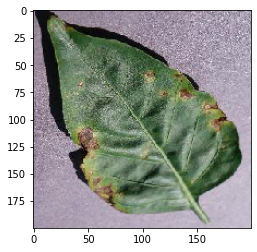

127.0.0.1 - - [16/Jul/2021 16:11:57] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:11:57] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:11:59] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:00] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a0dbf1f-1131-496f-b337-169ec6693e6f___NREC_B.Spot 9241.JPG
[1.6271904e-04 1.0475132e-03 6.8735647e-01 9.1177382e-02 1.7352121e-06
 9.2455368e-05 3.9554005e-05 1.5115345e-06 2.1107504e-01 2.5867493e-04
 2.6974801e-03 9.0138457e-04 1.6474912e-03 1.0919701e-03 2.4486464e-03]


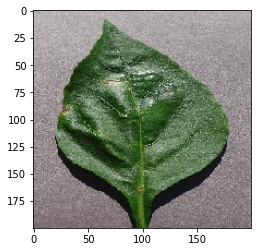

127.0.0.1 - - [16/Jul/2021 16:12:07] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:12:07] "GET /static/0a0dbf1f-1131-496f-b337-169ec6693e6f___NREC_B.Spot%209241.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:10] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:10] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a4c007d-41ab-4659-99cb-8a4ae4d07a55___NREC_B.Spot 1954.JPG
[2.7435261e-05 1.1676800e-03 9.8478436e-01 3.2246410e-04 1.7592924e-07
 3.5561488e-06 3.6892923e-06 9.1627946e-08 1.2659764e-02 2.9212872e-05
 3.7644114e-04 7.3096460e-05 2.1638154e-04 3.0071771e-05 3.0552337e-04]


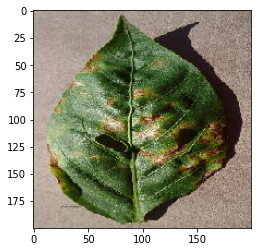

127.0.0.1 - - [16/Jul/2021 16:12:22] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:12:22] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:12:22] "GET /static/0a4c007d-41ab-4659-99cb-8a4ae4d07a55___NREC_B.Spot%201954.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:25] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:25] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a9cfb27-280e-475a-bbb4-8eeaeff38b8c___NREC_B.Spot 9177.JPG
[1.3816253e-02 4.8977920e-01 6.3212827e-02 3.4747592e-01 1.3010975e-04
 4.0430258e-04 9.8924516e-05 8.0804974e-03 3.1799816e-02 1.9713917e-03
 7.6453052e-03 4.3827365e-03 9.5753493e-03 1.1099157e-02 1.0528204e-02]


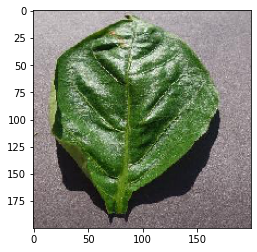

127.0.0.1 - - [16/Jul/2021 16:12:33] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:12:33] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:12:33] "GET /static/0a9cfb27-280e-475a-bbb4-8eeaeff38b8c___NREC_B.Spot%209177.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:39] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:39] "GET /static/css/style.css HTTP/1.1" 404 -


static/0abffc81-6be8-4b17-a83c-4d2830e30382___JR_B.Spot 9076.JPG
[3.9080396e-02 9.3735594e-01 1.0724775e-02 4.6728058e-03 3.7455204e-06
 2.4726745e-04 4.0278393e-03 1.1361005e-04 5.5128033e-04 2.3221581e-04
 9.3658065e-04 8.0889126e-04 4.1074952e-04 2.2591987e-04 6.0807652e-04]


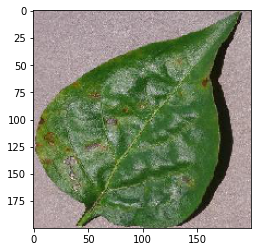

127.0.0.1 - - [16/Jul/2021 16:12:46] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:12:47] "GET /static/0abffc81-6be8-4b17-a83c-4d2830e30382___JR_B.Spot%209076.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:49] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:12:50] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b27c03f-b3bc-4d96-9b76-6fbd779404b9___NREC_B.Spot 1799.JPG
[2.3644348e-03 7.9020970e-02 8.8919795e-01 2.3694446e-04 6.3115444e-08
 4.9602991e-06 1.8184408e-06 6.5253185e-09 2.7870931e-02 1.6231507e-04
 3.8875217e-04 8.3516636e-05 2.1322934e-04 2.2245247e-04 2.3165240e-04]


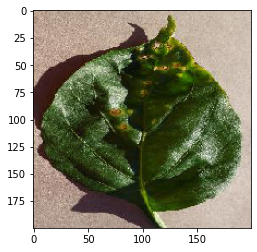

127.0.0.1 - - [16/Jul/2021 16:12:57] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:12:57] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:13:00] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:13:02] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b47ce18-7cfe-45e8-b21e-b83cb6282455___JR_B.Spot 3162.JPG
[1.4616288e-01 6.4452177e-01 1.9963051e-01 5.2030804e-03 8.5256761e-07
 3.0957122e-05 2.9228919e-05 4.1570408e-07 2.6298303e-04 6.2140368e-04
 7.2267454e-04 9.6914751e-05 1.0780153e-03 9.0135058e-04 7.3697191e-04]


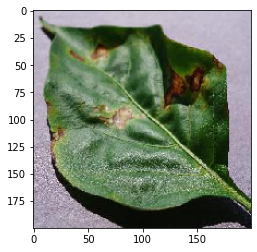

127.0.0.1 - - [16/Jul/2021 16:13:09] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:13:09] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:13:09] "GET /static/0b47ce18-7cfe-45e8-b21e-b83cb6282455___JR_B.Spot%203162.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:13:12] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:13:12] "GET /static/css/style.css HTTP/1.1" 404 -


static/0bd0f439-013b-40ed-a6d1-4e67e971d437___JR_B.Spot 3272.JPG
[5.3848879e-04 2.9290366e-01 1.9487320e-04 1.9796561e-03 1.6134947e-05
 7.0022482e-01 1.7961707e-03 1.1258365e-04 1.5556841e-04 7.5689670e-05
 1.4568350e-04 6.0635793e-04 4.5536974e-04 1.5743896e-04 6.3750538e-04]


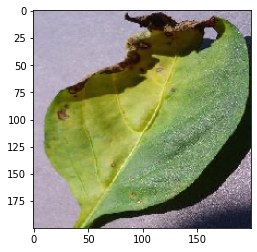

127.0.0.1 - - [16/Jul/2021 16:14:19] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:14:19] "GET /static/0bd0f439-013b-40ed-a6d1-4e67e971d437___JR_B.Spot%203272.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:14:19] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:14:22] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:14:22] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c1eb1fd-9e3a-4396-81bc-7d1d3eccc5ed___JR_B.Spot 3369.JPG
[7.8228404e-06 9.9997628e-01 7.4203165e-08 5.6805743e-07 2.0312493e-07
 6.6935663e-06 2.7419459e-08 1.0837468e-06 5.5516804e-08 1.1927042e-07
 1.9989729e-06 1.8480532e-06 1.5046176e-06 7.7039863e-07 9.3238958e-07]


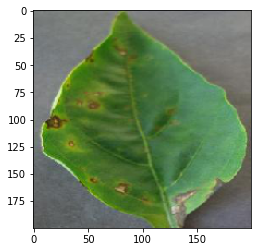

127.0.0.1 - - [16/Jul/2021 16:14:32] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:14:33] "GET /static/0c1eb1fd-9e3a-4396-81bc-7d1d3eccc5ed___JR_B.Spot%203369.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:14:33] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:14:35] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:14:35] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c4e75b2-e4aa-437e-815c-636271d66bec___JR_B.Spot 3244.JPG
[8.7441929e-02 9.0651667e-01 9.9397628e-05 2.3960574e-03 3.6259485e-06
 5.1258503e-05 2.0446363e-03 4.6702185e-06 4.8487502e-04 7.2176612e-05
 2.8574813e-04 1.6139982e-04 1.2548917e-04 9.5681789e-05 2.1639616e-04]


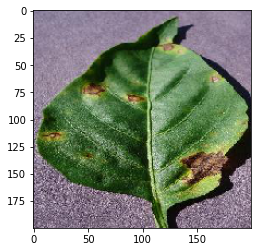

127.0.0.1 - - [16/Jul/2021 16:14:45] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:14:46] "GET /static/0c4e75b2-e4aa-437e-815c-636271d66bec___JR_B.Spot%203244.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:14:46] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:14:48] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:14:48] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c6f6805-490e-438c-b9cd-3fd7ee29f31b___NREC_B.Spot 9123.JPG
[5.0764756e-06 5.2853080e-04 8.2542682e-01 1.7065547e-01 3.0004853e-07
 1.9183026e-05 1.5414090e-06 6.5667537e-06 9.6154731e-04 9.1610535e-05
 6.6045253e-04 2.4467503e-04 6.6879945e-04 2.3620033e-04 4.9332780e-04]


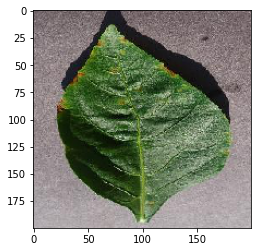

127.0.0.1 - - [16/Jul/2021 16:15:00] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:15:00] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:15:00] "GET /static/0c6f6805-490e-438c-b9cd-3fd7ee29f31b___NREC_B.Spot%209123.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:15:03] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:15:03] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c99cb45-b4e0-4ade-bba5-fab3b678f0bb___JR_B.Spot 8912.JPG
[3.4596337e-04 2.1289929e-03 7.2552633e-01 4.5581717e-02 3.2787747e-07
 7.0238377e-05 3.4574472e-04 1.5392860e-07 2.2137339e-01 1.7196880e-04
 1.4279697e-03 9.8227093e-04 7.2850654e-04 6.8250194e-04 6.3399476e-04]


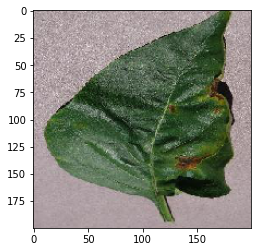

127.0.0.1 - - [16/Jul/2021 16:15:13] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:15:13] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:15:13] "GET /static/0c99cb45-b4e0-4ade-bba5-fab3b678f0bb___JR_B.Spot%208912.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:15:16] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:15:16] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a3f2927-4410-46a3-bfda-5f4769a5aaf8___JR_HL 8275.JPG
[8.42350564e-05 9.99091148e-01 4.76263194e-05 1.70927349e-04
 2.10901885e-06 1.19857705e-05 8.32746537e-07 1.77366339e-04
 4.28157473e-05 9.82659640e-06 1.15095943e-04 5.80033884e-05
 1.16820389e-04 4.38510397e-05 2.73737096e-05]


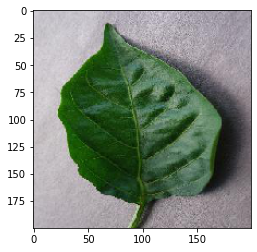

127.0.0.1 - - [16/Jul/2021 16:15:47] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:15:48] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:15:48] "GET /static/0a3f2927-4410-46a3-bfda-5f4769a5aaf8___JR_HL%208275.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:15:56] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:15:56] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ade14b6-8937-43ea-93eb-98343af6bae7___JR_HL 8026.JPG
[1.3191740e-04 4.1647154e-01 8.8279210e-03 5.5125993e-01 2.2207394e-07
 4.4236131e-04 2.6297258e-04 1.3791889e-06 1.6872004e-02 1.6257532e-04
 1.1441226e-03 2.4076000e-04 7.7457970e-04 1.8775564e-04 3.2198785e-03]


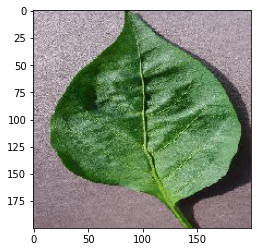

127.0.0.1 - - [16/Jul/2021 16:16:15] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:16:15] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:16:15] "GET /static/0ade14b6-8937-43ea-93eb-98343af6bae7___JR_HL%208026.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:16:21] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:16:21] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b76f650-27cf-4b62-b3ad-c97d81e0db0c___JR_HL 8554.JPG
[6.7642253e-10 3.7004878e-07 3.2748464e-02 9.6718830e-01 8.2602189e-12
 3.2822562e-08 4.0151633e-09 2.3350771e-11 2.2056684e-05 1.6566234e-07
 1.5016391e-06 1.0875726e-06 3.6294125e-05 5.9209867e-07 1.1347903e-06]


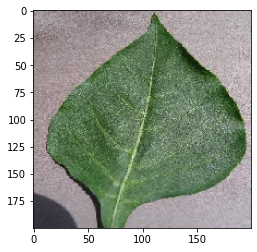

127.0.0.1 - - [16/Jul/2021 16:16:30] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:16:30] "GET /static/0b76f650-27cf-4b62-b3ad-c97d81e0db0c___JR_HL%208554.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:16:30] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:16:33] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:16:33] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b796b7a-dfc8-47f7-9970-8373263c6408___JR_HL 5948.JPG
[6.1020860e-06 1.2214111e-01 8.7658417e-01 2.9561701e-04 2.8314671e-08
 9.4340494e-06 7.1264726e-06 7.3502746e-09 5.3249131e-04 6.9549774e-06
 3.1871299e-05 1.4548615e-05 2.9616273e-04 2.0877165e-05 5.3447577e-05]


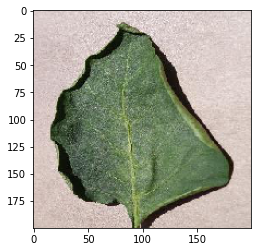

127.0.0.1 - - [16/Jul/2021 16:16:41] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:16:42] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:16:42] "GET /static/0b796b7a-dfc8-47f7-9970-8373263c6408___JR_HL%205948.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:16:44] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:16:45] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ba474dd-0cfd-4fd2-a58c-8e3d18dbe7c3___JR_HL 8395.JPG
[1.1648566e-06 9.9861121e-01 1.3490774e-06 1.2925552e-03 4.2918771e-09
 2.0117761e-06 1.7124022e-07 9.6079134e-08 1.3389637e-05 1.1977368e-06
 1.0092667e-05 1.0329077e-06 1.1272108e-05 4.8129796e-06 4.9655588e-05]


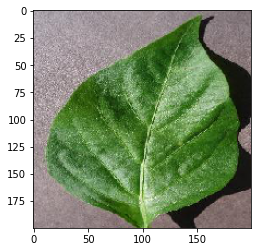

127.0.0.1 - - [16/Jul/2021 16:16:52] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:16:53] "GET /static/0ba474dd-0cfd-4fd2-a58c-8e3d18dbe7c3___JR_HL%208395.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:16:53] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:16:59] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:16:59] "GET /static/css/style.css HTTP/1.1" 404 -


static/0bb97c36-159d-4ee2-8b06-1fbf3f533af5___JR_HL 8345.JPG
[7.9938273e-10 2.9924902e-08 9.4274306e-01 5.6782994e-02 5.0882892e-12
 6.1683592e-09 2.0244750e-09 1.3999456e-12 4.0139491e-04 4.2284321e-07
 1.2039515e-06 1.6686542e-06 6.4339292e-05 4.2890196e-07 4.4681869e-06]


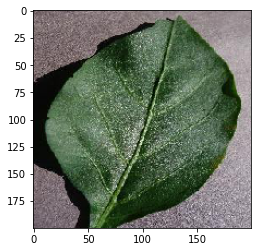

127.0.0.1 - - [16/Jul/2021 16:17:07] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:17:07] "GET /static/0bb97c36-159d-4ee2-8b06-1fbf3f533af5___JR_HL%208345.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:17:10] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:17:10] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c93ef1a-ccc8-4a62-9353-308e7da3ac3e___JR_HL 8245.JPG
[3.3108997e-06 9.9986398e-01 2.9218780e-08 1.1893544e-04 3.5165009e-08
 2.5357842e-08 2.5636796e-08 3.0178850e-08 5.4073007e-06 1.4327544e-07
 1.0119095e-06 3.9239225e-07 1.5451467e-06 2.5049872e-06 2.6210339e-06]


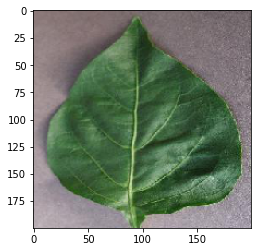

127.0.0.1 - - [16/Jul/2021 16:23:54] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:23:54] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:23:54] "GET /static/0c93ef1a-ccc8-4a62-9353-308e7da3ac3e___JR_HL%208245.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:05] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:05] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c102dad-d31f-469b-89d1-6fe7bf93708c___JR_HL 7689.JPG
[3.3443755e-06 9.9714595e-01 7.8668008e-06 2.7994334e-03 4.6915176e-08
 6.9696290e-07 3.1280172e-07 1.7580243e-08 3.0398778e-06 3.2615594e-07
 5.1715479e-06 4.2813090e-06 1.4796449e-05 3.5872079e-06 1.1162037e-05]


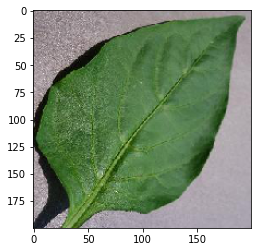

Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:24:12] "POST /result.html HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:12] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:24:12] "GET /static/0c102dad-d31f-469b-89d1-6fe7bf93708c___JR_HL%207689.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:18] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:19] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c002246-262c-46d7-9995-bd1e1b2737d9___JR_HL 7969.JPG
[9.2579554e-05 2.1463723e-01 7.0016593e-02 6.9920391e-01 4.2360166e-06
 3.1421485e-04 7.4989090e-05 1.6183869e-04 5.4519656e-03 7.4607780e-04
 1.7780404e-03 3.3930919e-04 2.7583053e-03 9.3431445e-04 3.4864054e-03]


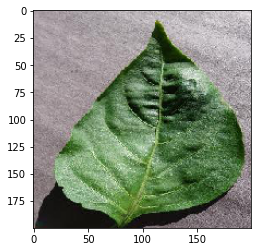

127.0.0.1 - - [16/Jul/2021 16:24:28] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:24:28] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:24:28] "GET /static/0c002246-262c-46d7-9995-bd1e1b2737d9___JR_HL%207969.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:31] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:31] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c102dad-d31f-469b-89d1-6fe7bf93708c___JR_HL 7689.JPG
[3.3443755e-06 9.9714595e-01 7.8668008e-06 2.7994334e-03 4.6915176e-08
 6.9696290e-07 3.1280172e-07 1.7580243e-08 3.0398778e-06 3.2615594e-07
 5.1715479e-06 4.2813090e-06 1.4796449e-05 3.5872079e-06 1.1162037e-05]


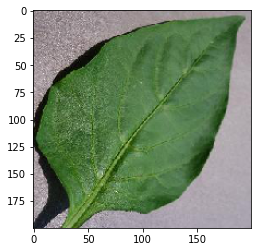

127.0.0.1 - - [16/Jul/2021 16:24:38] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:24:38] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:24:41] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:41] "GET /static/css/style.css HTTP/1.1" 404 -


static/0bb97c36-159d-4ee2-8b06-1fbf3f533af5___JR_HL 8345.JPG
[7.9938273e-10 2.9924902e-08 9.4274306e-01 5.6782994e-02 5.0882892e-12
 6.1683592e-09 2.0244750e-09 1.3999456e-12 4.0139491e-04 4.2284321e-07
 1.2039515e-06 1.6686542e-06 6.4339292e-05 4.2890196e-07 4.4681869e-06]


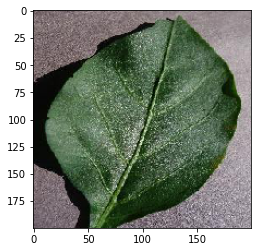

127.0.0.1 - - [16/Jul/2021 16:24:48] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:24:49] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:24:51] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:24:52] "GET /static/css/style.css HTTP/1.1" 404 -


static/0d4e35c0-f6d6-4810-9522-14e1d491a05d___JR_HL 8673.JPG
[7.4323416e-06 9.9989498e-01 1.2041186e-06 7.3664720e-05 3.2898415e-06
 4.1410530e-07 1.1643397e-07 1.1807206e-06 8.1855580e-07 8.3970957e-07
 5.2920468e-06 1.6443320e-06 9.9170109e-07 2.4559872e-06 5.6860449e-06]


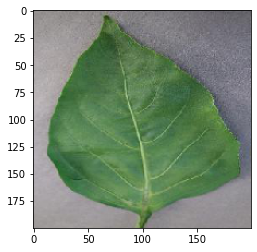

Prediction:

127.0.0.1 - - [16/Jul/2021 16:25:00] "POST /result.html HTTP/1.1" 200 -


 Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:25:00] "GET /static/0d4e35c0-f6d6-4810-9522-14e1d491a05d___JR_HL%208673.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:25:00] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:25:06] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:25:06] "GET /static/css/style.css HTTP/1.1" 404 -


static/0d4f19fe-9e85-4689-9c99-0b01a58db9f4___JR_HL 8032.JPG
[9.7089214e-03 8.9608508e-01 6.1335745e-03 3.8944624e-02 7.2646217e-04
 2.7371677e-02 7.7904126e-04 6.9064233e-03 1.3295909e-03 3.8860174e-04
 1.5528046e-03 2.0221705e-03 3.7420806e-03 1.1354588e-03 3.1735403e-03]


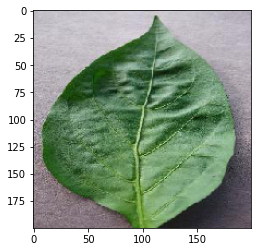

127.0.0.1 - - [16/Jul/2021 16:25:27] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:25:28] "GET /static/0d4f19fe-9e85-4689-9c99-0b01a58db9f4___JR_HL%208032.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:25:28] "GET /static/css/style.css HTTP/1.1" 404 -


static/000bf685-b305-408b-91f4-37030f8e62db___GH_HL Leaf 308.1.JPG
[1.58545049e-07 4.38536603e-07 8.39440450e-02 4.96852817e-03
 8.51662776e-08 3.35620389e-05 7.22266213e-06 6.55412880e-09
 9.09963012e-01 1.11553316e-04 1.30355620e-04 1.09633700e-04
 5.62702247e-04 1.22242011e-04 4.64618679e-05]


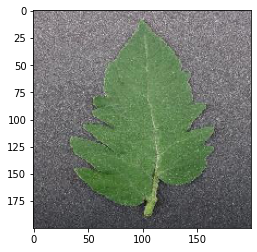

127.0.0.1 - - [16/Jul/2021 16:26:41] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:26:41] "GET /static/000bf685-b305-408b-91f4-37030f8e62db___GH_HL%20Leaf%20308.1.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:26:41] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:26:47] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:26:47] "GET /static/css/style.css HTTP/1.1" 404 -


static/00bce074-967b-4d50-967a-31fdaa35e688___RS_HL 0223.JPG
[1.4353954e-07 3.2721523e-06 5.9207249e-03 9.9266982e-01 2.7987372e-08
 2.5947261e-04 6.6518173e-06 6.7702450e-07 7.1996939e-04 1.7361530e-05
 3.3563862e-05 1.9494644e-05 2.5766759e-04 5.7543541e-05 3.3579963e-05]


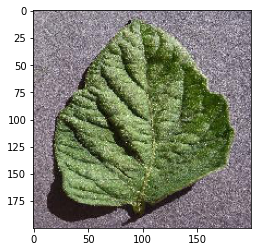

127.0.0.1 - - [16/Jul/2021 16:27:05] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:27:05] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:27:05] "GET /static/00bce074-967b-4d50-967a-31fdaa35e688___RS_HL%200223.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:27:08] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:27:08] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a0d6a11-ddd6-4dac-8469-d5f65af5afca___RS_HL 0555.JPG
[3.92904020e-09 3.75103504e-08 7.15784371e-01 2.84066260e-01
 2.20656791e-11 5.11106123e-07 1.26044055e-08 1.61544458e-10
 4.05743594e-05 1.41792066e-06 7.63622575e-06 3.82737107e-06
 8.70957883e-05 1.84636031e-06 6.37232779e-06]


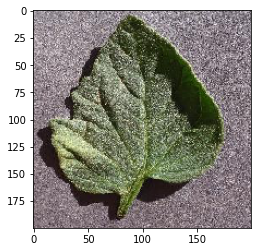

127.0.0.1 - - [16/Jul/2021 16:27:15] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:27:15] "GET /static/0a0d6a11-ddd6-4dac-8469-d5f65af5afca___RS_HL%200555.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:27:15] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:27:17] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:27:18] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a31e630-0d98-416b-b0e4-88a88aad1dc5___RS_HL 9653.JPG
[5.2351140e-07 6.5336906e-07 9.5503144e-03 2.7581356e-02 1.5063459e-07
 7.5399125e-06 1.0607974e-05 2.2699910e-08 9.6191579e-01 4.6147896e-05
 1.3152845e-04 5.2564010e-05 3.8626298e-04 1.1937648e-04 1.9730527e-04]


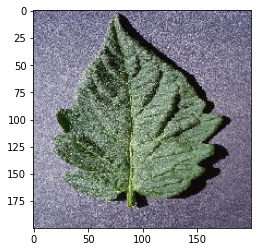

127.0.0.1 - - [16/Jul/2021 16:36:38] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:36:38] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:36:38] "GET /static/0a31e630-0d98-416b-b0e4-88a88aad1dc5___RS_HL%209653.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:36:46] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:36:46] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a86ddc0-4950-4efc-9260-0f16d4db046b___RS_HL 0469.JPG
[3.93703033e-07 1.88457088e-05 1.09430529e-01 8.31361830e-01
 6.67923583e-09 3.05149824e-05 1.28665188e-05 4.99388886e-09
 5.76804616e-02 3.01942946e-05 1.96540903e-04 5.23480412e-05
 9.75834788e-04 1.13690265e-04 9.58934179e-05]


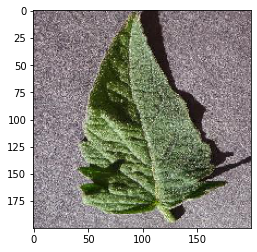

127.0.0.1 - - [16/Jul/2021 16:36:53] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:36:54] "GET /static/0a86ddc0-4950-4efc-9260-0f16d4db046b___RS_HL%200469.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:36:54] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:36:56] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:36:57] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a205a11-1e64-49f7-93c2-ad59312b4f83___RS_HL 0334.JPG
[5.19882413e-08 6.12092350e-08 4.90949839e-01 2.57728552e-03
 4.93000696e-10 1.80078428e-06 6.60173953e-07 7.66869693e-11
 5.06213605e-01 5.81298082e-06 7.31989639e-05 1.75364476e-05
 1.08275395e-04 1.59321498e-05 3.59381811e-05]


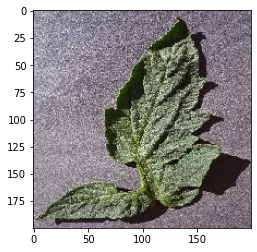

127.0.0.1 - - [16/Jul/2021 16:37:04] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:37:04] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:37:04] "GET /static/0a205a11-1e64-49f7-93c2-ad59312b4f83___RS_HL%200334.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:37:10] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:37:10] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a334ae6-bea3-4453-b200-85e082794d56___GH_HL Leaf 310.1.JPG
[1.0341874e-07 3.5208086e-07 4.6486324e-03 4.9637966e-03 2.6500825e-06
 7.1727195e-06 2.3150872e-06 9.1119560e-08 9.8972356e-01 6.2841689e-05
 8.0848622e-05 3.8355782e-05 2.8524717e-04 9.4374256e-05 8.9620829e-05]


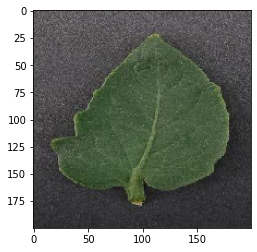

127.0.0.1 - - [16/Jul/2021 16:37:17] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:37:18] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:37:18] "GET /static/0a334ae6-bea3-4453-b200-85e082794d56___GH_HL%20Leaf%20310.1.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:37:23] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:37:24] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a9986e6-b629-4ff5-8aab-7488ea9b935b___RS_HL 9704.JPG
[2.5737488e-06 1.2359425e-05 1.8810523e-01 7.3928487e-01 8.2003112e-08
 2.7242479e-05 1.2177283e-05 7.3687076e-08 6.8902291e-02 1.1059500e-04
 3.7074636e-04 2.0437084e-04 2.6557129e-03 1.8629272e-04 1.2545148e-04]


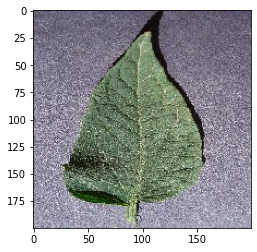

127.0.0.1 - - [16/Jul/2021 16:37:30] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:37:30] "GET /static/0a9986e6-b629-4ff5-8aab-7488ea9b935b___RS_HL%209704.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:37:32] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:37:32] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a9986e6-b629-4ff5-8aab-7488ea9b935b___RS_HL 9704.JPG
[2.5737488e-06 1.2359425e-05 1.8810523e-01 7.3928487e-01 8.2003112e-08
 2.7242479e-05 1.2177283e-05 7.3687076e-08 6.8902291e-02 1.1059500e-04
 3.7074636e-04 2.0437084e-04 2.6557129e-03 1.8629272e-04 1.2545148e-04]


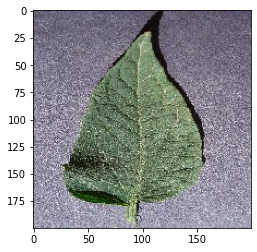

Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:38:07] "POST /result.html HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:38:07] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:38:09] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:38:09] "GET /static/css/style.css HTTP/1.1" 404 -


static/0aacdad5-c9b9-4309-96e3-0797bbed1375___RS_HL 9836.JPG
[2.5412069e-06 3.4169389e-05 8.5010380e-04 7.0072198e-01 4.1089284e-06
 1.1948739e-03 6.4810173e-04 7.1369345e-06 2.9496741e-01 1.4655797e-04
 1.7927705e-04 8.1729013e-05 6.2455621e-04 2.4159833e-04 2.9580222e-04]


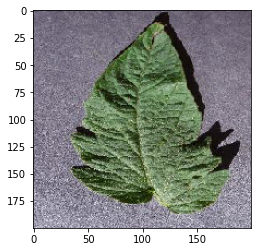

127.0.0.1 - - [16/Jul/2021 16:38:19] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:38:19] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:38:19] "GET /static/0aacdad5-c9b9-4309-96e3-0797bbed1375___RS_HL%209836.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:38:22] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:38:22] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b5cfce2-38fd-4984-8926-2d2911c48490___RS_HL 9733.JPG
[1.4877271e-06 3.2739470e-06 1.4356053e-01 6.0717734e-03 2.0061834e-06
 5.8081769e-05 1.5963007e-04 4.3694925e-08 8.4845066e-01 1.2654626e-04
 5.3660659e-04 1.3550898e-04 5.6633592e-04 1.4033909e-04 1.8721883e-04]


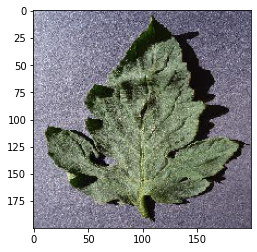

127.0.0.1 - - [16/Jul/2021 16:38:32] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:38:32] "GET /static/0b5cfce2-38fd-4984-8926-2d2911c48490___RS_HL%209733.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:38:32] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:38:41] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:38:41] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:38:52] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b330273-890c-4995-af72-cba070fc0061___GH_HL Leaf 312.JPG
[1.7203817e-08 7.3628669e-08 9.3778454e-02 8.8547885e-01 3.0072222e-10
 8.8794030e-07 3.7456804e-08 1.8769293e-09 1.9801024e-02 1.3501906e-05
 2.1171525e-05 1.0559622e-05 8.1409921e-04 5.2501673e-05 2.8713584e-05]


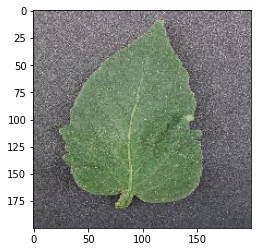

127.0.0.1 - - [16/Jul/2021 16:39:15] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:39:15] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:39:15] "GET /static/0b330273-890c-4995-af72-cba070fc0061___GH_HL%20Leaf%20312.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:39:18] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:39:18] "GET /static/css/style.css HTTP/1.1" 404 -


static/0cabff41-b00b-4692-98af-6b8b0aeba7aa___RS_HL 9774.JPG
[3.3289768e-07 8.5383118e-07 1.3249449e-01 8.2868081e-01 8.1186853e-09
 1.4115024e-05 1.1262562e-05 5.9304179e-09 3.7602112e-02 2.6965949e-05
 1.6408911e-04 6.1564468e-05 7.7366317e-04 4.0077161e-05 1.2967252e-04]


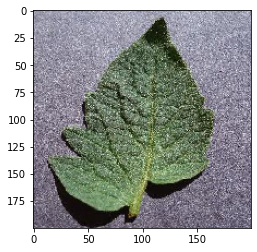

127.0.0.1 - - [16/Jul/2021 16:39:34] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:39:35] "GET /static/0cabff41-b00b-4692-98af-6b8b0aeba7aa___RS_HL%209774.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:39:35] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:39:37] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:39:37] "GET /static/css/style.css HTTP/1.1" 404 -


static/0caff918-5807-40f2-b9e4-7dd34a7bab5d___RS_HL 0345.JPG
[1.1922590e-08 6.8368095e-08 7.9326212e-01 2.0420995e-01 2.4864716e-10
 7.1918913e-07 3.9100740e-07 1.7228542e-10 1.9388383e-03 4.4491408e-06
 4.0454161e-05 1.2845135e-05 5.1353720e-04 5.1301536e-06 1.1484047e-05]


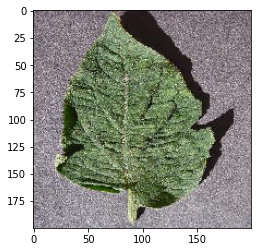

127.0.0.1 - - [16/Jul/2021 16:39:49] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:39:50] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:39:50] "GET /static/0caff918-5807-40f2-b9e4-7dd34a7bab5d___RS_HL%200345.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:39:52] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:39:52] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b5cfce2-38fd-4984-8926-2d2911c48490___RS_HL 9733.JPG
[1.4877271e-06 3.2739470e-06 1.4356053e-01 6.0717734e-03 2.0061834e-06
 5.8081769e-05 1.5963007e-04 4.3694925e-08 8.4845066e-01 1.2654626e-04
 5.3660659e-04 1.3550898e-04 5.6633592e-04 1.4033909e-04 1.8721883e-04]


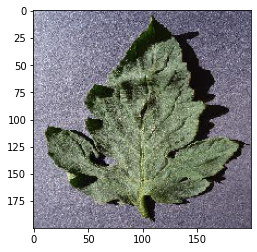

127.0.0.1 - - [16/Jul/2021 16:40:14] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:40:14] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:40:58] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:40:58] "GET /static/css/style.css HTTP/1.1" 404 -


static/00a7c269-3476-4d25-b744-44d6353cd921___GCREC_Bact.Sp 5807.JPG
[1.5736767e-05 3.3648790e-05 6.7789003e-02 7.1765058e-04 4.2987827e-04
 1.9989256e-02 3.8874801e-03 1.2333638e-05 9.0386456e-01 3.8362198e-04
 8.0027839e-04 6.4894516e-04 7.4396143e-04 1.9099479e-04 4.9276365e-04]


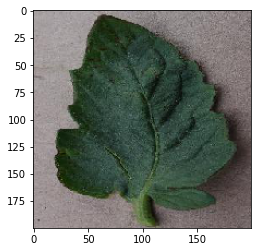

127.0.0.1 - - [16/Jul/2021 16:42:15] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:42:15] "GET /static/00a7c269-3476-4d25-b744-44d6353cd921___GCREC_Bact.Sp%205807.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:15] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:42:17] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:18] "GET /static/css/style.css HTTP/1.1" 404 -


static/00b7e89a-e129-4576-b51f-48923888bff9___GCREC_Bact.Sp 6202.JPG
[7.0430724e-07 3.0161956e-07 1.1844990e-02 1.9364546e-04 8.6527698e-06
 3.6521389e-05 4.6527326e-05 2.4072975e-07 9.8731786e-01 2.9959874e-05
 2.0722093e-04 1.5419956e-04 8.8351895e-05 2.4692621e-05 4.6140554e-05]


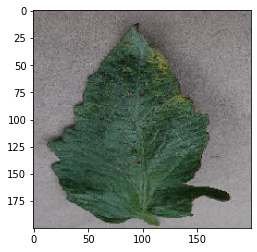

127.0.0.1 - - [16/Jul/2021 16:42:24] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:42:25] "GET /static/00b7e89a-e129-4576-b51f-48923888bff9___GCREC_Bact.Sp%206202.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:25] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:42:27] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:27] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a6d40e4-75d6-4659-8bc1-22f47cdb2ca8___GCREC_Bact.Sp 6247.JPG
[1.3141408e-05 2.6032027e-05 6.6173720e-01 3.6819454e-03 5.6714409e-05
 1.0185756e-03 3.4783610e-05 4.8070319e-07 3.2993683e-01 2.3366390e-04
 5.7869864e-04 5.2799407e-04 1.5410762e-03 3.0707291e-04 3.0576769e-04]


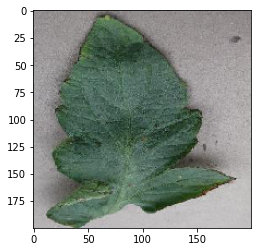

127.0.0.1 - - [16/Jul/2021 16:42:34] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:42:35] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:42:35] "GET /static/0a6d40e4-75d6-4659-8bc1-22f47cdb2ca8___GCREC_Bact.Sp%206247.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:37] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:37] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a22f50a-5f25-4cf6-816b-76cae94b7f30___GCREC_Bact.Sp 6103.JPG
[4.2292755e-04 4.2686965e-03 3.0453151e-02 6.4304119e-01 3.0065013e-02
 1.4101584e-01 6.1527733e-04 4.0426377e-02 8.2312398e-02 1.5767722e-03
 4.7645713e-03 5.7436009e-03 7.5659519e-03 3.1575800e-03 4.5706485e-03]


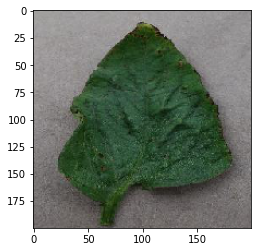

127.0.0.1 - - [16/Jul/2021 16:42:45] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:42:45] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:42:45] "GET /static/0a22f50a-5f25-4cf6-816b-76cae94b7f30___GCREC_Bact.Sp%206103.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:47] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:48] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a1655ed-797c-4d1d-ba35-dc255d68a2ee___GCREC_Bact.Sp 3560.JPG
[3.3837205e-04 7.3885471e-02 1.9096419e-03 6.7602229e-01 5.3223474e-03
 1.6502602e-03 1.9682968e-02 1.2476170e-01 7.6353081e-02 2.3342536e-03
 4.5333491e-03 1.6899324e-03 4.5499834e-03 4.2073769e-03 2.7589402e-03]


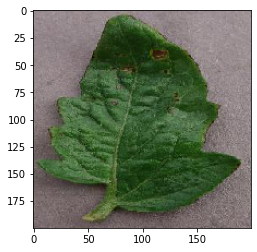

127.0.0.1 - - [16/Jul/2021 16:42:55] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:42:55] "GET /static/0a1655ed-797c-4d1d-ba35-dc255d68a2ee___GCREC_Bact.Sp%203560.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:55] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:42:57] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:42:57] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a64655c-4052-4e5f-a696-2a6cf25d10c9___GCREC_Bact.Sp 6017.JPG
[1.4268603e-04 1.8048061e-04 9.3733257e-01 2.5278598e-03 1.7157075e-03
 2.4667952e-02 9.9773193e-03 2.6370093e-04 1.7833713e-02 4.9222010e-04
 1.3400827e-03 1.0285669e-03 9.8656176e-04 3.7833117e-04 1.1322773e-03]


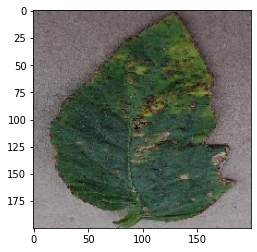

127.0.0.1 - - [16/Jul/2021 16:43:04] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:43:05] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:43:05] "GET /static/0a64655c-4052-4e5f-a696-2a6cf25d10c9___GCREC_Bact.Sp%206017.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:43:07] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:43:07] "GET /static/css/style.css HTTP/1.1" 404 -


static/0aa1c431-682b-4a6e-af5f-2a7081ea2e97___GCREC_Bact.Sp 3622.JPG
[6.9200441e-06 1.1056785e-05 1.9472901e-04 8.4475143e-04 7.4653531e-04
 2.1007071e-04 3.7449044e-03 1.4577020e-04 9.9240232e-01 2.4444112e-04
 3.5254363e-04 2.6925167e-04 4.0778590e-04 2.3392031e-04 1.8502449e-04]


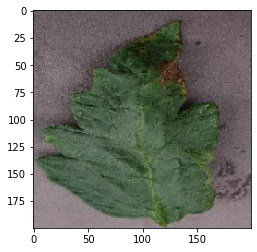

127.0.0.1 - - [16/Jul/2021 16:43:14] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:43:14] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:43:14] "GET /static/0aa1c431-682b-4a6e-af5f-2a7081ea2e97___GCREC_Bact.Sp%203622.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:43:17] "GET /?submit= HTTP/1.1" 200 -


static/0ab9c705-f29e-45ac-b786-9549b3c38f16___GCREC_Bact.Sp 3223.JPG
[1.2780592e-06 4.7788063e-07 5.8327120e-04 2.5293450e-05 1.6087604e-05
 1.8898627e-05 5.7533110e-04 6.4146377e-07 9.9843019e-01 2.1363403e-05
 9.5858704e-05 8.6095584e-05 6.2194915e-05 1.5799807e-05 6.7187459e-05]


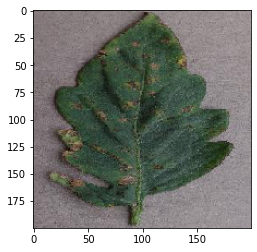

127.0.0.1 - - [16/Jul/2021 16:44:09] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:44:09] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:44:09] "GET /static/0ab9c705-f29e-45ac-b786-9549b3c38f16___GCREC_Bact.Sp%203223.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:44:11] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:44:11] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ab41c2e-c6fc-4ef1-9ffb-ce1b241d32be___GCREC_Bact.Sp 3426.JPG
[7.37323535e-06 7.83898395e-06 1.13028586e-01 4.11461835e-04
 2.49624078e-04 3.05410521e-03 1.87725294e-03 1.09646735e-05
 8.78229916e-01 4.78432223e-04 6.23270636e-04 6.97005657e-04
 6.57158671e-04 3.56595498e-04 3.10390780e-04]


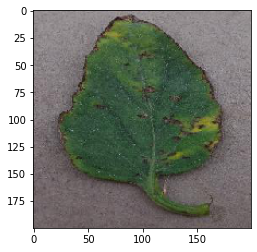

127.0.0.1 - - [16/Jul/2021 16:44:21] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:44:22] "GET /static/0ab41c2e-c6fc-4ef1-9ffb-ce1b241d32be___GCREC_Bact.Sp%203426.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:44:22] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:44:25] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:44:25] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ab54691-ba9f-4c1f-a69b-ec0501df4401___GCREC_Bact.Sp 3170.JPG
[5.35797062e-06 6.15584577e-06 1.89572910e-03 2.87215516e-04
 5.40863199e-04 1.21960684e-03 1.94416847e-03 1.12811395e-05
 9.92650926e-01 2.90518248e-04 2.97974359e-04 2.67422845e-04
 3.22591688e-04 1.58002498e-04 1.02148435e-04]


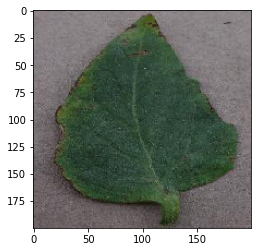

127.0.0.1 - - [16/Jul/2021 16:44:39] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:44:39] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:44:39] "GET /static/0ab54691-ba9f-4c1f-a69b-ec0501df4401___GCREC_Bact.Sp%203170.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:44:42] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:44:42] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ac8c80f-6d67-46ee-b662-8265d9df9183___GCREC_Bact.Sp 6115.JPG
[7.66203448e-05 7.05786468e-03 1.93560481e-01 2.84621995e-02
 4.04400006e-03 6.28530800e-01 1.07342668e-01 1.04488223e-03
 1.08248545e-02 1.63632270e-03 2.42982479e-03 3.19527276e-03
 6.27278024e-03 2.39307340e-03 3.12834699e-03]


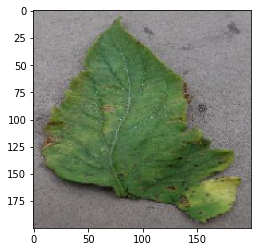

127.0.0.1 - - [16/Jul/2021 16:44:54] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:44:55] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:44:55] "GET /static/0ac8c80f-6d67-46ee-b662-8265d9df9183___GCREC_Bact.Sp%206115.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:45:00] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:45:00] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ad88d7a-c14a-4ac9-8520-c11a0ade3a8f___UF.GRC_BS_Lab Leaf 0996.JPG
[0.05856617 0.54681903 0.00949233 0.05720738 0.04170121 0.10140853
 0.021272   0.00072924 0.11027813 0.0027363  0.01193822 0.0058868
 0.01290612 0.00711038 0.01194812]


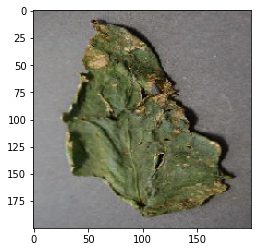

127.0.0.1 - - [16/Jul/2021 16:45:10] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:45:10] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:45:10] "GET /static/0ad88d7a-c14a-4ac9-8520-c11a0ade3a8f___UF.GRC_BS_Lab%20Leaf%200996.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:45:13] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:45:13] "GET /static/css/style.css HTTP/1.1" 404 -


static/00ce4c63-9913-4b16-898c-29f99acf0dc3___RS_Late.B 4982.JPG
[7.4982432e-05 9.1477511e-03 4.9689040e-04 6.4459827e-04 7.6878830e-05
 9.7552514e-01 8.1878472e-03 9.5872529e-05 4.2045917e-03 1.3527508e-04
 1.3446463e-04 4.3991438e-04 3.4780381e-04 1.6417187e-04 3.2384892e-04]


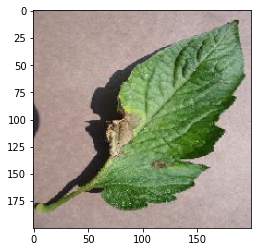

127.0.0.1 - - [16/Jul/2021 16:45:48] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:45:48] "GET /static/00ce4c63-9913-4b16-898c-29f99acf0dc3___RS_Late.B%204982.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:45:48] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:45:56] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:45:57] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a3f65fc-ef1c-4aed-b235-46bae4e5c0e7___GHLB2 Leaf 9065.JPG
[1.35233961e-06 2.23072129e-05 1.18908611e-05 7.50257641e-06
 4.40184340e-06 9.99373019e-01 4.39428753e-04 2.23156803e-05
 6.42729938e-05 4.65544008e-06 6.52236213e-06 1.16307510e-05
 7.52770393e-06 1.08190525e-05 1.23919981e-05]


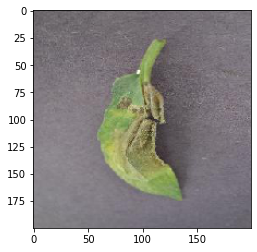

127.0.0.1 - - [16/Jul/2021 16:46:04] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:46:05] "GET /static/0a3f65fc-ef1c-4aed-b235-46bae4e5c0e7___GHLB2%20Leaf%209065.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:46:05] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:46:14] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:46:14] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a4b3cde-c83a-4c83-b037-010369738152___RS_Late.B 6985.JPG
[3.4328109e-06 2.5364675e-03 3.2962431e-04 3.1555563e-05 2.2352388e-06
 9.9659282e-01 1.6648948e-04 5.1706515e-06 1.0482300e-04 2.6677135e-05
 1.2545282e-05 3.6675185e-05 7.0389870e-05 2.6324029e-05 5.4749358e-05]


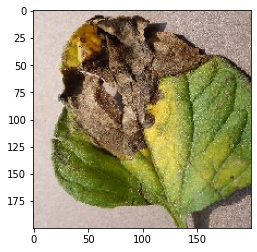

127.0.0.1 - - [16/Jul/2021 16:46:22] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:46:23] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:46:23] "GET /static/0a4b3cde-c83a-4c83-b037-010369738152___RS_Late.B%206985.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:46:28] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:46:29] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a39aa48-3f94-4696-9e43-ff4a93529dc3___RS_Late.B 5103.JPG
[8.1588914e-06 3.7828144e-05 1.9444659e-01 1.6574519e-02 1.6900731e-05
 2.2791545e-03 1.6366034e-04 9.6610358e-07 7.8217691e-01 2.0966120e-04
 1.0736419e-03 2.9264743e-04 1.5263400e-03 3.2277385e-04 8.7021297e-04]


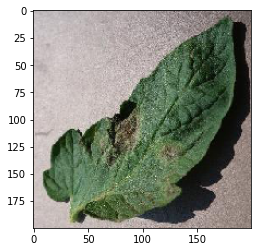

Prediction: 

127.0.0.1 - - [16/Jul/2021 16:46:36] "POST /result.html HTTP/1.1" 200 -


Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:46:36] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:46:36] "GET /static/0a39aa48-3f94-4696-9e43-ff4a93529dc3___RS_Late.B%205103.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:46:41] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:46:41] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a6203b9-ced0-4934-ae23-4a7d2e2e2fdd___RS_Late.B 6424.JPG
[1.8129870e-06 8.6868170e-04 6.0408188e-06 5.3970443e-06 1.0991164e-06
 9.9907398e-01 7.9506381e-06 1.7173204e-06 2.4517344e-06 2.7129788e-06
 5.3261425e-07 3.2243577e-06 1.3032585e-05 2.7663502e-06 8.6110313e-06]


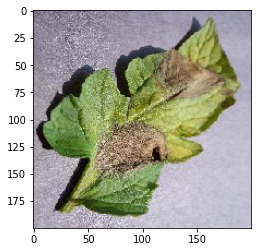

127.0.0.1 - - [16/Jul/2021 16:47:10] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:47:10] "GET /static/0a6203b9-ced0-4934-ae23-4a7d2e2e2fdd___RS_Late.B%206424.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:47:10] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:47:16] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:47:16] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a8967d4-bb72-4fe4-8096-55fc57437557___RS_Late.B 6974.JPG
[9.3693848e-07 1.5898512e-03 5.2244227e-06 7.0776724e-07 5.4295543e-07
 9.9837190e-01 3.2130365e-06 4.6629275e-06 4.4759813e-07 4.4623825e-06
 3.4741689e-07 1.4504931e-06 7.5490993e-06 3.1467619e-06 5.5314940e-06]


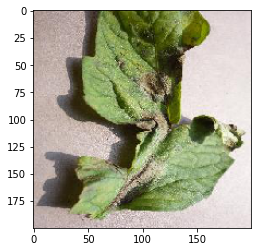

127.0.0.1 - - [16/Jul/2021 16:47:23] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:47:24] "GET /static/0a8967d4-bb72-4fe4-8096-55fc57437557___RS_Late.B%206974.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:47:24] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:47:31] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:47:31] "GET /static/css/style.css HTTP/1.1" 404 -


static/00f16858-f392-4d9e-ad9f-efab8049a13f___JR_Sept.L.S 8368.JPG
[3.6898327e-06 6.3482141e-05 4.7824107e-04 1.0222360e-03 7.0891315e-06
 1.6464587e-04 9.9101895e-01 1.4270275e-06 6.8641226e-03 2.4604011e-05
 9.9636170e-05 7.6131953e-05 7.1052229e-05 4.3490149e-05 6.1084662e-05]


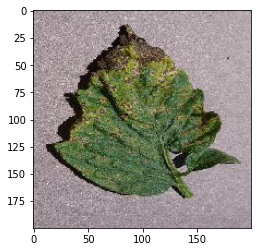

127.0.0.1 - - [16/Jul/2021 16:48:10] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Septoria_leaf_spot


127.0.0.1 - - [16/Jul/2021 16:48:11] "GET /static/00f16858-f392-4d9e-ad9f-efab8049a13f___JR_Sept.L.S%208368.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:48:11] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:48:16] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:48:17] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a5edec2-e297-4a25-86fc-78f03772c100___JR_Sept.L.S 8468.JPG
[3.17705504e-04 6.97196554e-03 2.79125012e-02 1.55022945e-02
 5.23504350e-05 5.89644946e-02 5.03485799e-01 3.65791173e-04
 3.66544425e-01 7.14335416e-04 6.09739730e-03 7.18216458e-03
 1.26913050e-03 1.40867324e-03 3.21100769e-03]


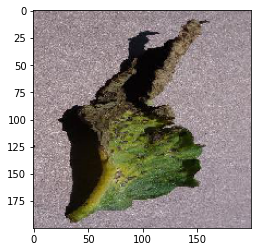

127.0.0.1 - - [16/Jul/2021 16:48:26] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Septoria_leaf_spot


127.0.0.1 - - [16/Jul/2021 16:48:26] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:48:26] "GET /static/0a5edec2-e297-4a25-86fc-78f03772c100___JR_Sept.L.S%208468.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:48:35] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:48:35] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a25f893-1b5f-4845-baa1-f68ac03d96ac___Matt.S_CG 7863.JPG
[3.11350334e-04 2.60987636e-02 1.08283736e-01 6.74881756e-01
 2.46916548e-04 1.15097597e-01 2.37021986e-02 5.90834022e-03
 1.74970776e-02 1.38012471e-03 5.28560113e-03 5.01328846e-03
 7.38786254e-03 3.64084588e-03 5.26457978e-03]


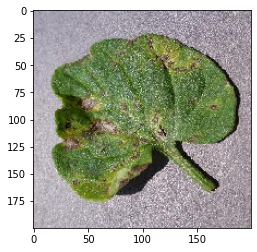

127.0.0.1 - - [16/Jul/2021 16:48:42] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___healthy


127.0.0.1 - - [16/Jul/2021 16:48:43] "GET /static/0a25f893-1b5f-4845-baa1-f68ac03d96ac___Matt.S_CG%207863.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:48:43] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:48:45] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:48:46] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a68a294-30d1-4422-ab7e-a1909ec277f7___JR_Sept.L.S 8443.JPG
[4.8726353e-05 1.6626259e-03 1.2051634e-03 2.1890129e-03 4.4016353e-05
 1.5007915e-03 9.8338473e-01 4.6154837e-05 7.9059312e-03 2.2419936e-04
 4.8691608e-04 3.9559958e-04 2.5765327e-04 2.6053310e-04 3.8790080e-04]


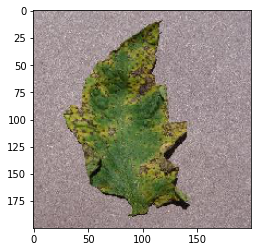

127.0.0.1 - - [16/Jul/2021 16:49:25] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Septoria_leaf_spot


127.0.0.1 - - [16/Jul/2021 16:49:26] "GET /static/0a68a294-30d1-4422-ab7e-a1909ec277f7___JR_Sept.L.S%208443.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:49:26] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:49:31] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:49:32] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a95b5b7-7bfb-4201-9320-dae33498081a___JR_Sept.L.S 2482.JPG
[1.4776389e-04 1.0862662e-02 1.1884819e-04 5.1708100e-04 7.2491821e-05
 8.8126636e-01 1.0516913e-01 1.4321768e-04 4.1007379e-04 2.0472164e-04
 1.1628723e-04 3.2706096e-04 1.9047754e-04 8.2008497e-05 3.7187911e-04]


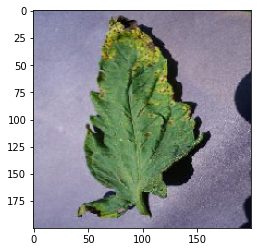

127.0.0.1 - - [16/Jul/2021 16:49:39] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:49:39] "GET /static/0a95b5b7-7bfb-4201-9320-dae33498081a___JR_Sept.L.S%202482.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:49:45] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:49:45] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a70601b-8511-4a56-9562-c95c46372874___Matt.S_CG 1032.JPG
[1.1179933e-06 7.1750374e-06 2.8226605e-06 4.1889880e-06 9.8097746e-07
 8.2617777e-04 9.9909770e-01 1.0195728e-06 2.3846667e-05 8.8413935e-06
 4.9529453e-06 8.4949852e-06 2.4074291e-06 3.9329425e-06 6.2559470e-06]


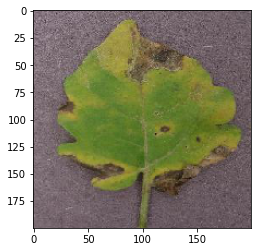

127.0.0.1 - - [16/Jul/2021 16:49:56] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Septoria_leaf_spot


127.0.0.1 - - [16/Jul/2021 16:49:56] "GET /static/0a70601b-8511-4a56-9562-c95c46372874___Matt.S_CG%201032.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:49:56] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:50:02] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:50:02] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a76257e-6a78-459b-8f51-a266805121eb___Matt.S_CG 2527.JPG
[2.0773336e-06 5.2066616e-06 9.3956930e-07 2.1767022e-05 1.0058385e-06
 2.3886239e-06 9.9992323e-01 1.1185191e-06 1.4081144e-05 4.1578755e-06
 6.6011357e-06 2.6091457e-06 2.7256081e-06 2.0034340e-06 1.0173840e-05]


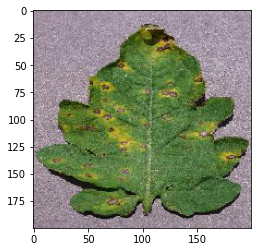

127.0.0.1 - - [16/Jul/2021 16:50:09] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Septoria_leaf_spot


127.0.0.1 - - [16/Jul/2021 16:50:10] "GET /static/0a76257e-6a78-459b-8f51-a266805121eb___Matt.S_CG%202527.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:50:17] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:50:18] "GET /static/css/style.css HTTP/1.1" 404 -


static/00a538f3-8421-43ab-9e6f-758d36180dd3___YLCV_NREC 2667.JPG
[1.8994621e-04 1.2638609e-01 7.7775711e-01 2.2431094e-02 5.9163863e-06
 2.1382462e-02 4.3428561e-04 3.7652490e-04 3.2330785e-02 2.5731948e-04
 4.7168871e-03 3.3657406e-03 6.9914381e-03 1.6692886e-03 1.7050758e-03]


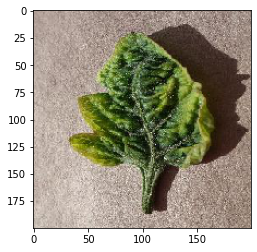

127.0.0.1 - - [16/Jul/2021 16:50:59] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:51:00] "GET /static/00a538f3-8421-43ab-9e6f-758d36180dd3___YLCV_NREC%202667.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:51:00] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:51:04] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:51:04] "GET /static/css/style.css HTTP/1.1" 404 -


static/00b814ee-cfa9-489a-bed3-c1f927bef05a___YLCV_NREC 0220.JPG
[7.8032690e-06 1.5293140e-04 1.6473427e-05 3.8000895e-04 4.1146782e-06
 4.3628243e-05 3.2548170e-04 9.9873763e-01 8.8082481e-05 2.5288527e-05
 5.7087298e-05 2.7654492e-05 1.8997504e-05 6.4122942e-05 5.0711100e-05]


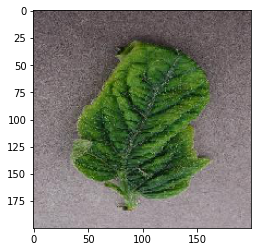

127.0.0.1 - - [16/Jul/2021 16:51:13] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato__Tomato_YellowLeaf__Curl_Virus


127.0.0.1 - - [16/Jul/2021 16:51:13] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:51:13] "GET /static/00b814ee-cfa9-489a-bed3-c1f927bef05a___YLCV_NREC%200220.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:51:47] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:51:47] "GET /static/css/style.css HTTP/1.1" 404 -


static/00b41556-fe22-41fb-93aa-76b0c45d923a___UF.GRC_YLCV_Lab 02644.JPG
[3.4921817e-04 4.5872754e-01 1.8887606e-05 1.2216562e-03 2.6870055e-05
 9.4468203e-05 8.3071391e-05 5.3509092e-01 1.7160310e-04 1.2500962e-04
 2.1766990e-03 3.3717777e-04 7.8085402e-04 4.7839811e-04 3.1762233e-04]


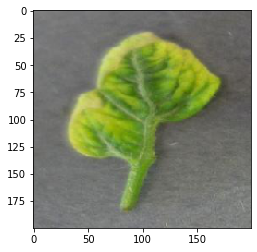

127.0.0.1 - - [16/Jul/2021 16:51:55] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato__Tomato_YellowLeaf__Curl_Virus


127.0.0.1 - - [16/Jul/2021 16:51:55] "GET /static/00b41556-fe22-41fb-93aa-76b0c45d923a___UF.GRC_YLCV_Lab%2002644.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:51:55] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:52:02] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:52:03] "GET /static/css/style.css HTTP/1.1" 404 -


static/00c16232-5beb-41a1-9a05-b18a02f10ca1___YLCV_NREC 2536.JPG
[2.5833822e-07 1.2123847e-06 2.7435852e-02 5.2438414e-04 2.3240672e-09
 3.8192769e-07 6.6662432e-07 2.3112949e-10 9.7187549e-01 5.3837098e-06
 4.8779657e-05 1.6649183e-05 5.7226633e-05 1.1752601e-05 2.1956499e-05]


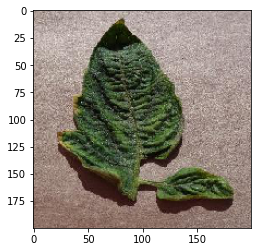

127.0.0.1 - - [16/Jul/2021 16:52:18] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:52:19] "GET /static/00c16232-5beb-41a1-9a05-b18a02f10ca1___YLCV_NREC%202536.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:52:19] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:52:21] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:52:22] "GET /static/css/style.css HTTP/1.1" 404 -


static/00e8f0db-abfd-4991-b51f-b87ab7e24612___YLCV_GCREC 2519.JPG
[1.3238630e-04 2.5588556e-04 1.0074625e-01 6.2259618e-02 1.4512432e-04
 2.0190869e-02 4.9319263e-03 5.7203200e-02 7.3272747e-01 2.3105179e-03
 3.8946194e-03 3.2337406e-03 2.9408603e-03 4.3121660e-03 4.7152680e-03]


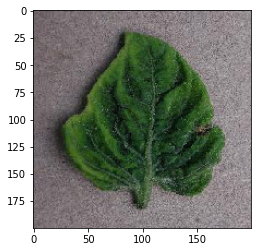

127.0.0.1 - - [16/Jul/2021 16:52:28] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:52:28] "GET /static/00e8f0db-abfd-4991-b51f-b87ab7e24612___YLCV_GCREC%202519.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:52:30] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:52:31] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a0fe942-bb9e-4384-8466-779017d00bcf___UF.GRC_YLCV_Lab 02192.JPG
[9.2294431e-06 2.8330954e-03 2.2977109e-07 2.2694609e-05 8.9014293e-07
 5.6207688e-07 5.9614570e-07 9.9708611e-01 1.3942058e-06 7.4488762e-06
 1.1575751e-05 4.1389990e-06 6.3652519e-06 7.8590620e-06 7.8132371e-06]


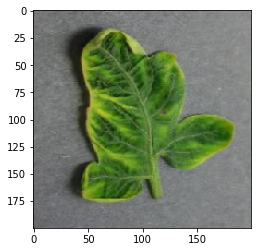

127.0.0.1 - - [16/Jul/2021 16:52:38] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato__Tomato_YellowLeaf__Curl_Virus


127.0.0.1 - - [16/Jul/2021 16:52:38] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:52:38] "GET /static/0a0fe942-bb9e-4384-8466-779017d00bcf___UF.GRC_YLCV_Lab%2002192.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:52:47] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:52:47] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a1d1def-462c-46d3-90e6-2a11fcb45a21___UF.GRC_YLCV_Lab 01675.JPG
[2.41977643e-04 6.77573502e-01 1.19165335e-04 1.30351225e-03
 1.45049917e-03 4.72495472e-03 7.19153613e-04 3.09792101e-01
 4.12162655e-04 8.28935532e-04 7.64093769e-04 6.17493584e-04
 4.72610613e-04 3.63262196e-04 6.16622681e-04]


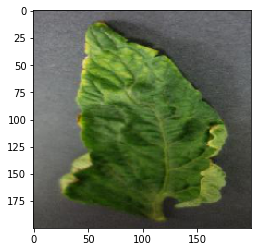

127.0.0.1 - - [16/Jul/2021 16:52:57] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:52:57] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:52:57] "GET /static/0a1d1def-462c-46d3-90e6-2a11fcb45a21___UF.GRC_YLCV_Lab%2001675.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:53:00] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:53:00] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a1e2ed0-619c-43da-8c47-f8000a252954___UF.GRC_YLCV_Lab 03060.JPG
[1.0513739e-04 9.4930565e-01 9.8743601e-07 1.4163685e-04 4.2446036e-06
 6.7270694e-06 1.4122505e-06 5.0158937e-02 1.2966135e-05 2.4847244e-05
 2.8963866e-05 4.9483118e-05 3.3362332e-05 6.0965838e-05 6.4760417e-05]


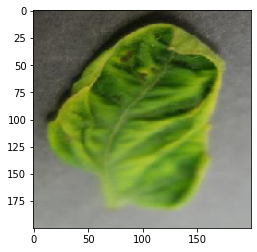

127.0.0.1 - - [16/Jul/2021 16:53:07] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:53:07] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:53:07] "GET /static/0a1e2ed0-619c-43da-8c47-f8000a252954___UF.GRC_YLCV_Lab%2003060.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:53:10] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:53:10] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a3befdb-c654-435b-b834-d3451436afd3___YLCV_NREC 2313.JPG
[3.4000157e-04 6.3492738e-02 3.9862448e-01 4.9186070e-02 1.2147692e-05
 1.2435139e-03 2.1474122e-03 8.0741505e-05 4.6637091e-01 7.3475920e-04
 7.8482358e-03 2.9449556e-03 3.0899656e-03 1.7533766e-03 2.1307790e-03]


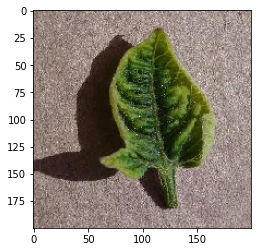

127.0.0.1 - - [16/Jul/2021 16:54:07] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_healthy


127.0.0.1 - - [16/Jul/2021 16:54:07] "GET /static/0a3befdb-c654-435b-b834-d3451436afd3___YLCV_NREC%202313.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:54:07] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:54:10] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:54:10] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a3d19ca-a126-4ea3-83e3-0abb0e9b02e3___YLCV_GCREC 2449.JPG
[4.7054786e-05 5.9311194e-05 6.1852479e-01 2.4391568e-01 2.4195089e-05
 3.7882932e-02 4.2592597e-05 3.8217470e-02 4.5233477e-02 1.7998200e-03
 1.5981107e-03 2.1554548e-03 4.1589634e-03 3.3005262e-03 3.0395854e-03]


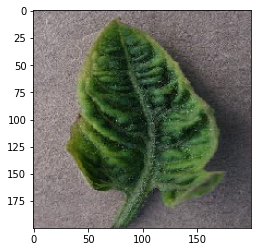

127.0.0.1 - - [16/Jul/2021 16:54:19] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:54:19] "GET /static/0a3d19ca-a126-4ea3-83e3-0abb0e9b02e3___YLCV_GCREC%202449.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:54:19] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:54:22] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:54:22] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a5f0d25-53a0-47d4-b3fa-984ec3b2a2fb___YLCV_GCREC 5214.JPG
[2.8308608e-07 2.0178963e-06 9.9788100e-01 9.1319715e-05 4.0401108e-08
 1.0928444e-06 1.0596469e-07 1.3358113e-08 1.9319741e-03 4.5560810e-06
 1.8040904e-05 6.1251321e-06 5.1096809e-05 3.8275566e-06 8.4167104e-06]


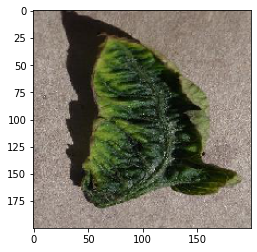

127.0.0.1 - - [16/Jul/2021 16:54:30] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 16:54:30] "GET /static/0a5f0d25-53a0-47d4-b3fa-984ec3b2a2fb___YLCV_GCREC%205214.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:54:32] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:54:32] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a9ce4eb-961b-4f11-a06f-2946cfd0d562___UF.GRC_YLCV_Lab 02233.JPG
[2.0085377e-04 2.1529508e-01 2.2995026e-05 5.9227855e-04 1.4990929e-03
 7.7144444e-01 1.6773537e-03 5.2657784e-03 2.5490936e-04 1.0653605e-03
 1.7369087e-04 6.2984054e-04 4.8387761e-04 7.0943474e-04 6.8501127e-04]


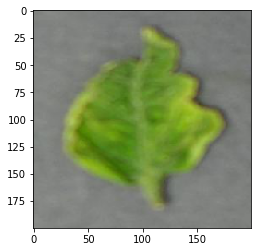

127.0.0.1 - - [16/Jul/2021 16:54:44] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 16:54:44] "GET /static/0a9ce4eb-961b-4f11-a06f-2946cfd0d562___UF.GRC_YLCV_Lab%2002233.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:54:44] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:54:46] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:54:47] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a14b65b-2e45-4bed-be45-c482a40a4f7c___UF.GRC_YLCV_Lab 02090.JPG
[1.3696319e-05 9.9203050e-01 8.1022694e-07 2.8380464e-05 1.2141737e-06
 1.2586279e-06 1.9392868e-07 7.8588929e-03 3.5176904e-06 4.6557357e-06
 1.2325718e-05 1.1129762e-05 1.3193119e-05 1.1760272e-05 8.4951917e-06]


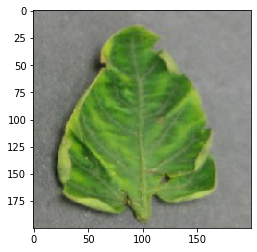

127.0.0.1 - - [16/Jul/2021 16:54:58] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:54:58] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:54:58] "GET /static/0a14b65b-2e45-4bed-be45-c482a40a4f7c___UF.GRC_YLCV_Lab%2002090.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:55:00] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:55:01] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a9e37a2-95d5-4af7-95a1-2cbb67074452___YLCV_NREC 2291.JPG
[1.0690036e-04 9.4916821e-01 1.8646147e-02 6.6926023e-03 1.5228559e-05
 8.2163913e-03 1.3203770e-03 4.1274852e-04 7.6208767e-03 1.2682185e-04
 1.9122601e-03 1.2631188e-03 2.4307682e-03 5.9553434e-04 1.4720019e-03]


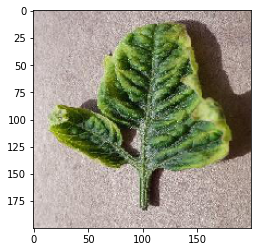

127.0.0.1 - - [16/Jul/2021 16:55:13] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:55:14] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:55:14] "GET /static/0a9e37a2-95d5-4af7-95a1-2cbb67074452___YLCV_NREC%202291.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:55:16] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:55:16] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a22fcaa-634d-4711-b2a8-777063377543___UF.GRC_YLCV_Lab 03238.JPG
[3.6624202e-05 9.8981220e-01 2.0044145e-06 8.4296691e-05 4.4012854e-06
 1.0512300e-05 1.0874960e-06 9.8702572e-03 1.3022261e-05 1.1372991e-05
 2.4497771e-05 3.5538553e-05 2.8349399e-05 2.3652859e-05 4.2267195e-05]


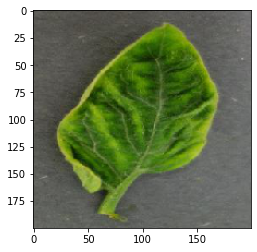

127.0.0.1 - - [16/Jul/2021 16:57:23] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:57:23] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:57:23] "GET /static/0a22fcaa-634d-4711-b2a8-777063377543___UF.GRC_YLCV_Lab%2003238.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:57:26] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:57:26] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a25c782-93a7-4a08-ace0-0ec025cba908___UF.GRC_YLCV_Lab 01945.JPG
[4.0951671e-04 9.6788514e-01 8.5776228e-06 1.0608424e-03 3.2380471e-05
 4.5349800e-05 9.4365518e-05 2.9307691e-02 2.0471922e-04 6.8204834e-05
 2.9067261e-04 1.3361246e-04 1.8716259e-04 8.9639965e-05 1.8205777e-04]


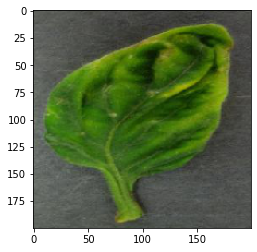

127.0.0.1 - - [16/Jul/2021 16:57:40] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:57:40] "GET /static/0a25c782-93a7-4a08-ace0-0ec025cba908___UF.GRC_YLCV_Lab%2001945.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:57:40] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:57:43] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:57:43] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a85f197-fa0e-4665-be11-d52e84a45878___UF.GRC_YLCV_Lab 02732.JPG
[1.8622994e-04 7.0548350e-01 3.1711443e-05 8.3103910e-04 5.2895793e-05
 3.3078183e-04 3.2129185e-05 2.9149958e-01 1.0477493e-04 2.7222981e-04
 2.5710274e-04 1.6557159e-04 1.7820096e-04 3.3119958e-04 2.4310425e-04]


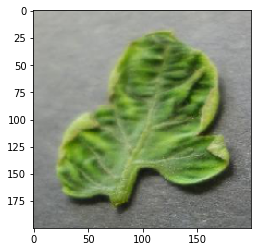

127.0.0.1 - - [16/Jul/2021 16:57:55] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:57:55] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:57:55] "GET /static/0a85f197-fa0e-4665-be11-d52e84a45878___UF.GRC_YLCV_Lab%2002732.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:57:57] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:57:57] "GET /static/css/style.css HTTP/1.1" 404 -


static/0a5431ac-44ff-4507-a8aa-6eee46235015___UF.GRC_YLCV_Lab 03031.JPG
[2.6707225e-05 9.9864119e-01 1.2838724e-06 1.2582263e-04 7.4922791e-06
 7.0651018e-05 7.8972080e-06 9.4157434e-04 1.6399013e-05 5.1156268e-05
 1.5672764e-05 3.0811440e-05 3.6039131e-05 1.6069289e-05 1.1185823e-05]


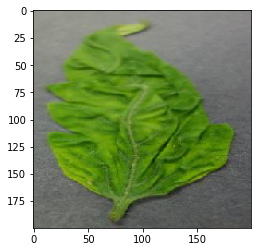

127.0.0.1 - - [16/Jul/2021 16:58:09] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:58:09] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:58:09] "GET /static/0a5431ac-44ff-4507-a8aa-6eee46235015___UF.GRC_YLCV_Lab%2003031.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:58:12] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:58:12] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ab15cde-93e5-41ff-8fd5-db09c6829d72___YLCV_GCREC 2293.JPG
[2.3991521e-04 8.6063540e-01 2.9520053e-05 5.4012210e-04 3.9538395e-06
 2.3153514e-04 2.1467797e-05 1.3625154e-01 1.5997658e-04 2.1447836e-04
 4.7486159e-04 2.3333418e-04 2.0873139e-04 6.2441593e-04 1.3085728e-04]


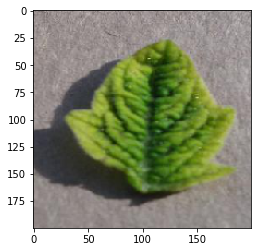

127.0.0.1 - - [16/Jul/2021 16:58:38] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:58:39] "GET /static/0ab15cde-93e5-41ff-8fd5-db09c6829d72___YLCV_GCREC%202293.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:58:39] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:58:41] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:58:42] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c9ad7ef-1db7-4a0b-864d-7b6ca98a0282___UF.GRC_YLCV_Lab 01506.JPG
[6.5553148e-04 5.5868506e-01 3.4517307e-05 8.1509154e-04 8.2735387e-05
 3.9886811e-01 2.6845420e-02 4.5553665e-03 1.9644448e-03 9.2097220e-04
 1.0319654e-03 1.4799366e-03 1.2184290e-03 5.1258772e-04 2.3298089e-03]


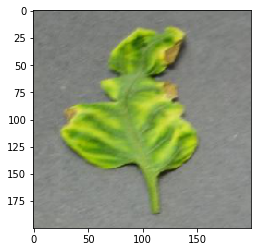

127.0.0.1 - - [16/Jul/2021 16:58:55] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:58:55] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:58:55] "GET /static/0c9ad7ef-1db7-4a0b-864d-7b6ca98a0282___UF.GRC_YLCV_Lab%2001506.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:58:58] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:58:58] "GET /static/css/style.css HTTP/1.1" 404 -


static/0b458337-20be-4c8d-ae8d-184cd60ee8c1___UF.GRC_YLCV_Lab 01311.JPG
[6.4519058e-06 9.9916553e-01 8.4990624e-08 1.2710632e-05 1.9844575e-07
 5.3064866e-07 3.2946097e-08 7.8781950e-04 4.6007847e-07 1.4118468e-06
 4.7419539e-06 5.1594079e-06 3.0017254e-06 4.8277811e-06 7.0550886e-06]


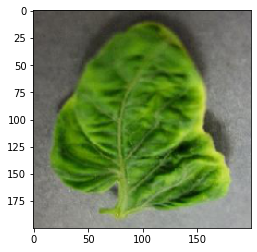

127.0.0.1 - - [16/Jul/2021 16:59:11] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:59:12] "GET /static/0b458337-20be-4c8d-ae8d-184cd60ee8c1___UF.GRC_YLCV_Lab%2001311.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:59:12] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:59:14] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:59:14] "GET /static/css/style.css HTTP/1.1" 404 -


static/86089870-b24b-4509-abc3-f6c50fd07e49___UF.GRC_YLCV_Lab 01677.JPG
[9.0783193e-05 9.7577447e-01 1.7871906e-05 1.6682096e-04 2.0583957e-05
 4.3872823e-03 1.0711752e-05 1.8975738e-02 7.8927933e-06 6.7207591e-05
 7.5358359e-05 1.3078166e-04 1.2936085e-04 4.8797392e-05 9.6338124e-05]


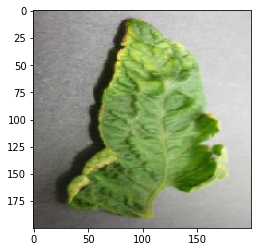

127.0.0.1 - - [16/Jul/2021 16:59:32] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:59:32] "GET /static/86089870-b24b-4509-abc3-f6c50fd07e49___UF.GRC_YLCV_Lab%2001677.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:59:32] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:59:34] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:59:35] "GET /static/css/style.css HTTP/1.1" 404 -


static/15553f35-1de9-4218-8472-6382d2c69597___UF.GRC_YLCV_Lab 01809.JPG
[1.9941812e-05 9.6645689e-01 3.9291995e-06 1.1510949e-04 1.3788021e-05
 3.2556031e-02 5.9932372e-05 2.0389727e-04 4.2407566e-05 7.1033319e-05
 2.3955045e-05 1.4444480e-04 1.2545800e-04 5.2699914e-05 1.1046981e-04]


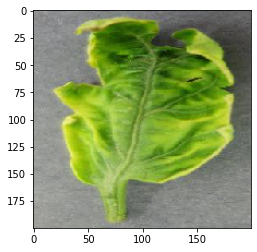

127.0.0.1 - - [16/Jul/2021 16:59:45] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 16:59:45] "GET /static/15553f35-1de9-4218-8472-6382d2c69597___UF.GRC_YLCV_Lab%2001809.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:59:45] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 16:59:47] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 16:59:48] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c9f5882-6af4-4472-8504-0987cdb4048a___UF.GRC_YLCV_Lab 01610.JPG
[1.27676816e-04 9.82918262e-01 2.89948684e-06 1.04678504e-04
 4.30403634e-06 1.22989804e-05 3.30825947e-06 1.64098497e-02
 7.33403067e-05 5.47095624e-05 6.54659816e-05 2.59208955e-05
 4.93848856e-05 8.09517878e-05 6.68698267e-05]


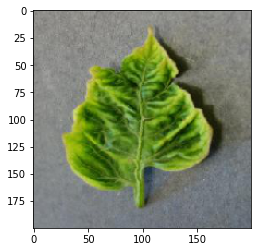

127.0.0.1 - - [16/Jul/2021 17:00:07] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:00:08] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:00:08] "GET /static/0c9f5882-6af4-4472-8504-0987cdb4048a___UF.GRC_YLCV_Lab%2001610.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:00:10] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:00:10] "GET /static/css/style.css HTTP/1.1" 404 -


static/57db8b40-4ca9-4bb9-9def-a03d6c5a362d___UF.GRC_YLCV_Lab 08466.JPG
[3.1911096e-04 8.2276732e-01 5.7858002e-04 3.0313730e-03 9.8934339e-04
 9.3905710e-02 3.5681073e-02 2.4254050e-02 2.0627130e-03 6.2601455e-03
 1.1297971e-03 2.3455955e-03 2.3327027e-03 2.5221158e-03 1.8202572e-03]


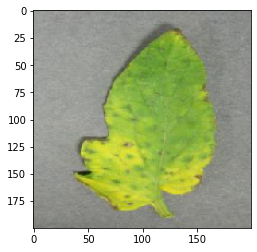

127.0.0.1 - - [16/Jul/2021 17:00:21] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:00:22] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:00:22] "GET /static/57db8b40-4ca9-4bb9-9def-a03d6c5a362d___UF.GRC_YLCV_Lab%2008466.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:00:24] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:00:24] "GET /static/css/style.css HTTP/1.1" 404 -


static/0ae828f5-e6e8-4100-b297-52f98dfc6109___UF.GRC_YLCV_Lab 01958.JPG
[1.2616913e-05 9.9987078e-01 1.0373106e-07 1.7844393e-05 2.2953814e-07
 9.4768558e-07 7.6012086e-08 7.4941723e-05 3.3405138e-06 1.4603871e-06
 2.7838091e-06 4.2494398e-06 3.9290962e-06 3.6875751e-06 3.0011354e-06]


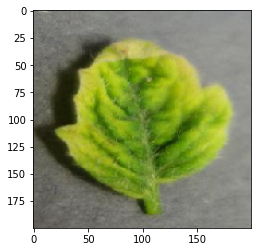

127.0.0.1 - - [16/Jul/2021 17:00:44] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:00:44] "GET /static/0ae828f5-e6e8-4100-b297-52f98dfc6109___UF.GRC_YLCV_Lab%2001958.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:00:44] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:00:47] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:00:47] "GET /static/css/style.css HTTP/1.1" 404 -


static/7b7b589f-1bb8-43fb-8fa0-b510e200dd99___JR_B.Spot 9061.JPG
[3.4300498e-05 9.9936885e-01 5.2107471e-06 4.4359957e-05 6.5012608e-07
 3.1644438e-04 1.6799304e-05 5.3593685e-06 2.3396929e-05 8.1341177e-06
 2.6540529e-05 5.0303293e-05 7.4610020e-05 5.2572127e-06 1.9728212e-05]


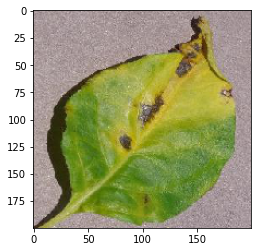

127.0.0.1 - - [16/Jul/2021 17:01:00] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:01:01] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:01:01] "GET /static/7b7b589f-1bb8-43fb-8fa0-b510e200dd99___JR_B.Spot%209061.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:03] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:03] "GET /static/css/style.css HTTP/1.1" 404 -


static/0d524d59-fb02-481b-9034-64f1de0da914___NREC_B.Spot 9060.JPG
[2.4794799e-05 8.2405582e-05 9.9934965e-01 1.2836810e-04 7.1032558e-09
 2.3784069e-06 2.8984502e-08 5.6585447e-09 2.7687452e-04 6.6022017e-06
 4.2488275e-05 6.9436906e-06 2.7841674e-05 7.4545669e-06 4.4126667e-05]


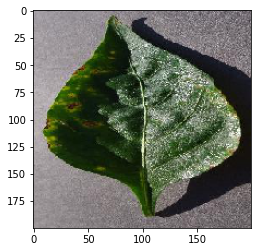

127.0.0.1 - - [16/Jul/2021 17:01:12] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 17:01:13] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:01:13] "GET /static/0d524d59-fb02-481b-9034-64f1de0da914___NREC_B.Spot%209060.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:15] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:15] "GET /static/css/style.css HTTP/1.1" 404 -


static/0c2392f6-3e69-4baf-b9f3-197623f6631a___JR_B.Spot 3176.JPG
[1.6736391e-05 9.9998069e-01 1.8152665e-09 4.6880166e-07 2.4404702e-11
 1.1333793e-08 2.9984928e-08 2.2704635e-08 2.4268735e-08 1.1985223e-07
 9.8350222e-07 4.2939485e-07 3.5684624e-07 3.9558671e-08 7.3668325e-08]


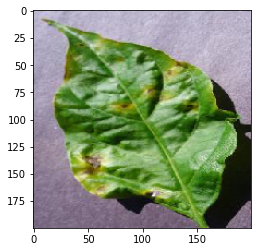

127.0.0.1 - - [16/Jul/2021 17:01:30] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:01:30] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:01:30] "GET /static/0c2392f6-3e69-4baf-b9f3-197623f6631a___JR_B.Spot%203176.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:32] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:33] "GET /static/css/style.css HTTP/1.1" 404 -


static/0d8421cd-eebc-4018-b591-12352dd970a7___JR_B.Spot 3234.JPG
[1.8887869e-05 9.9978799e-01 4.4995538e-08 2.1692183e-06 8.2668379e-09
 1.6087687e-04 5.9794070e-07 2.7510255e-08 1.2665875e-05 1.7808090e-06
 1.7591508e-06 4.4978588e-06 6.2511299e-06 9.0182914e-07 1.5541458e-06]


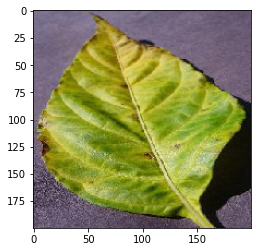

127.0.0.1 - - [16/Jul/2021 17:01:42] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:01:42] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:01:42] "GET /static/0d8421cd-eebc-4018-b591-12352dd970a7___JR_B.Spot%203234.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:45] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:45] "GET /static/css/style.css HTTP/1.1" 404 -


static/fe079adb-1a16-4c71-822d-bbb25a21314f___JR_B.Spot 3276.JPG
[5.4228036e-05 7.8815901e-01 3.7126051e-06 6.5254048e-05 2.1134872e-06
 2.1130450e-01 1.6438786e-04 5.3863710e-06 7.2737753e-06 2.0613481e-05
 1.1390599e-05 6.0381852e-05 7.8515652e-05 2.8047838e-05 3.5217799e-05]


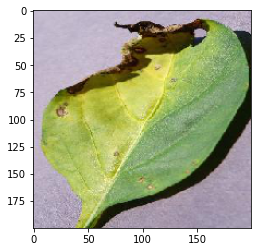

127.0.0.1 - - [16/Jul/2021 17:01:56] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:01:56] "GET /static/fe079adb-1a16-4c71-822d-bbb25a21314f___JR_B.Spot%203276.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:56] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:01:58] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:01:59] "GET /static/css/style.css HTTP/1.1" 404 -


static/b9e58d0f-1b01-43b0-8c50-154b12f5a5f1___JR_B.Spot 8983.JPG
[2.3265607e-03 6.6794060e-02 8.2221234e-01 6.2625773e-02 3.7275204e-05
 9.9456380e-04 7.5124428e-03 7.8223908e-05 2.4698395e-02 3.9996841e-04
 2.7796957e-03 3.0485794e-03 2.1614872e-03 1.1556374e-03 3.1750239e-03]


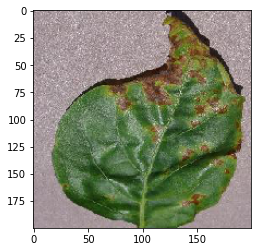

127.0.0.1 - - [16/Jul/2021 17:02:10] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 17:02:11] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:02:11] "GET /static/b9e58d0f-1b01-43b0-8c50-154b12f5a5f1___JR_B.Spot%208983.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:02:14] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:02:14] "GET /static/css/style.css HTTP/1.1" 404 -


static/3ddc56a6-7b13-43ae-841a-c6f6818d001b___JR_B.Spot 3190.JPG
[1.6573419e-04 9.6672922e-01 3.7154321e-05 1.8500819e-04 3.6782151e-06
 3.2127202e-02 2.0284073e-04 1.6207361e-05 4.1081792e-05 6.2582301e-05
 3.2466556e-05 4.6443925e-05 2.2914412e-04 1.0451591e-05 1.1086416e-04]


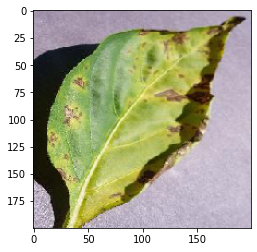

127.0.0.1 - - [16/Jul/2021 17:02:32] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:02:32] "GET /static/3ddc56a6-7b13-43ae-841a-c6f6818d001b___JR_B.Spot%203190.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:02:32] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:02:34] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:02:35] "GET /static/css/style.css HTTP/1.1" 404 -


static/0d9b55df-a8c0-4784-b1e4-957c8d679513___NREC_B.Spot 1825.JPG
[3.8994598e-04 9.9112964e-01 4.6007577e-03 2.1782995e-04 4.2686648e-07
 3.2269041e-04 1.3402469e-05 3.6271007e-07 2.5903359e-03 2.5835339e-05
 2.0062632e-04 1.1261482e-04 2.3662472e-04 7.6935619e-05 8.2110106e-05]


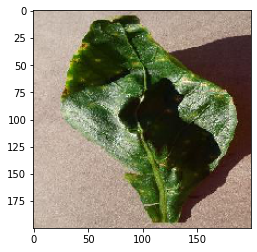

127.0.0.1 - - [16/Jul/2021 17:02:44] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:02:45] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:02:45] "GET /static/0d9b55df-a8c0-4784-b1e4-957c8d679513___NREC_B.Spot%201825.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:02:47] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:02:47] "GET /static/css/style.css HTTP/1.1" 404 -


static/01dfb88b-cd5a-420c-b163-51f5fe07b74d___JR_B.Spot 9091.JPG
[8.75119353e-04 9.87793505e-01 2.70000546e-05 2.01728268e-04
 3.02170201e-06 9.40913800e-03 5.85322967e-04 7.46011792e-05
 1.27361724e-04 7.57432499e-05 1.31805107e-04 3.99844255e-04
 1.08360386e-04 4.27302148e-05 1.44730730e-04]


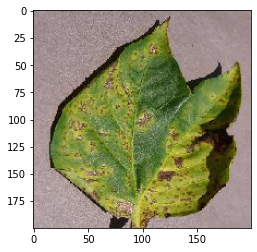

127.0.0.1 - - [16/Jul/2021 17:02:58] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:02:59] "GET /static/01dfb88b-cd5a-420c-b163-51f5fe07b74d___JR_B.Spot%209091.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:02:59] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:03:01] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:03:02] "GET /static/css/style.css HTTP/1.1" 404 -


static/1b589f92-a658-4e58-96de-db41acc411ce___JR_B.Spot 3239.JPG
[5.3967222e-05 9.9787033e-01 1.6426778e-06 7.4143041e-05 1.4061499e-07
 1.5957787e-03 1.9434186e-05 7.1689129e-07 2.3140101e-04 1.6095812e-05
 1.3502000e-05 2.7577093e-05 5.5653680e-05 6.9319776e-06 3.2586326e-05]


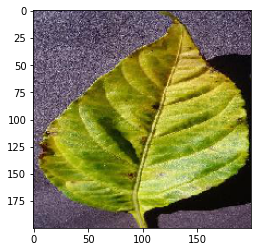

127.0.0.1 - - [16/Jul/2021 17:03:17] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:03:17] "GET /static/1b589f92-a658-4e58-96de-db41acc411ce___JR_B.Spot%203239.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:03:17] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:03:19] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:03:19] "GET /static/css/style.css HTTP/1.1" 404 -


static/2c4a898a-9812-423b-bd8a-419a09699270___JR_B.Spot 8853.JPG
[8.5592892e-06 8.5640144e-01 1.7671273e-03 1.4090079e-01 4.5542439e-08
 1.6153522e-06 6.5931986e-06 2.1359076e-08 5.5358879e-04 3.8401454e-06
 3.9235729e-05 3.3025302e-05 1.1648590e-04 1.1220132e-04 5.5428587e-05]


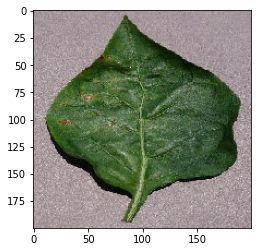

127.0.0.1 - - [16/Jul/2021 17:05:47] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:05:47] "GET /static/2c4a898a-9812-423b-bd8a-419a09699270___JR_B.Spot%208853.JPG HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:05:47] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:08:05] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:08:05] "GET /static/css/style.css HTTP/1.1" 404 -


static/pepper-spot.jpg
[6.55111682e-04 9.96562064e-01 2.24107666e-07 4.25902253e-05
 8.74825190e-09 3.33062957e-07 1.69729972e-07 2.57663522e-03
 1.19642010e-07 3.31468300e-06 1.20221499e-04 1.01590485e-05
 6.44032525e-06 5.97092048e-06 1.67322760e-05]


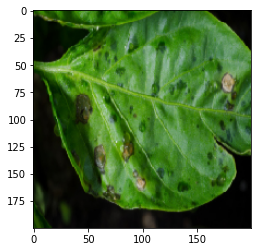

127.0.0.1 - - [16/Jul/2021 17:08:21] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:08:21] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:08:21] "GET /static/pepper-spot.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:08:25] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:08:25] "GET /static/css/style.css HTTP/1.1" 404 -


static/bls5x2400-10hrvsi.jpg
[1.2559014e-03 4.4845892e-03 9.9278146e-01 5.2669529e-05 2.4820963e-06
 2.1260483e-04 2.1482763e-04 5.1593253e-07 2.9397893e-04 1.6772137e-04
 2.1487968e-04 6.4979846e-05 1.3223817e-04 4.5478031e-05 7.5736782e-05]


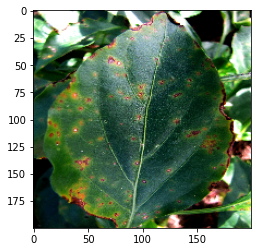

127.0.0.1 - - [16/Jul/2021 17:08:36] "POST /result.html HTTP/1.1" 200 -


Prediction: Potato___Early_blight


127.0.0.1 - - [16/Jul/2021 17:08:36] "GET /static/bls5x2400-10hrvsi.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:08:37] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:09:25] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:09:25] "GET /static/css/style.css HTTP/1.1" 404 -


static/download.jpg
[2.4922985e-05 9.9993503e-01 5.0431368e-08 1.9791358e-05 4.5461380e-08
 3.1591608e-06 2.7010074e-09 5.2331291e-07 1.8516570e-08 3.7692564e-07
 4.1006238e-06 5.6911904e-07 3.0851725e-06 6.1182682e-06 2.3260159e-06]


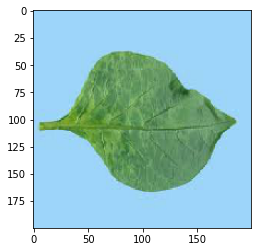

Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:09:34] "POST /result.html HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:09:35] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:09:35] "GET /static/download.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:11:06] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:11:06] "GET /static/css/style.css HTTP/1.1" 404 -


static/download (1).jpg
[2.8270440e-08 9.9999964e-01 1.0702282e-09 1.9596298e-08 4.8408163e-11
 1.2768281e-07 4.0379085e-11 7.5034579e-10 2.4731333e-09 3.1794933e-09
 2.8323818e-08 1.8962144e-08 1.2597978e-07 1.2611627e-08 7.1145116e-08]


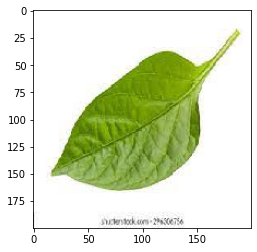

127.0.0.1 - - [16/Jul/2021 17:11:14] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:11:14] "GET /static/download%20%281%29.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:11:14] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:11:20] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:11:20] "GET /static/css/style.css HTTP/1.1" 404 -


static/Bell-pepper-leaves.jpg
[3.0232731e-03 4.1739914e-01 2.2777928e-04 2.2888614e-04 7.5024541e-06
 5.6961232e-01 6.5898777e-05 4.8403695e-06 7.6952139e-03 1.8907552e-04
 1.9825548e-04 6.5077108e-04 3.5181912e-04 1.8491695e-04 1.6035019e-04]


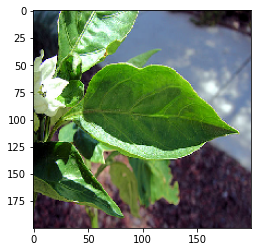

127.0.0.1 - - [16/Jul/2021 17:11:27] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 17:11:28] "GET /static/Bell-pepper-leaves.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:11:28] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:11:32] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:11:32] "GET /static/css/style.css HTTP/1.1" 404 -


static/download (2).jpg
[4.7849740e-06 1.3148092e-04 3.5165103e-05 3.6359015e-05 1.2165002e-05
 9.9852246e-01 6.4913055e-04 1.8547953e-04 2.2328213e-04 3.1560325e-05
 1.6591550e-05 2.8536318e-05 2.5677871e-05 3.7736794e-05 5.9567203e-05]


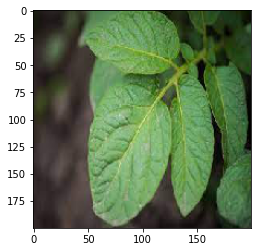

127.0.0.1 - - [16/Jul/2021 17:13:46] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 17:13:47] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:13:47] "GET /static/download%20%282%29.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:13:49] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:13:49] "GET /static/css/style.css HTTP/1.1" 404 -


static/fresh-green-leaf-potato-plant-260nw-449327257.jpg
[4.6920682e-06 9.9961096e-01 7.5894877e-07 2.9745957e-05 3.0177887e-08
 3.2154360e-04 4.3518114e-08 1.9856053e-07 2.2816720e-07 5.7749457e-07
 1.6718712e-06 3.8642488e-06 1.8828185e-05 6.2724297e-07 6.3170537e-06]


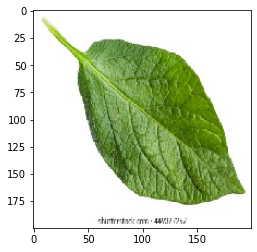

127.0.0.1 - - [16/Jul/2021 17:13:56] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:13:56] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:13:56] "GET /static/fresh-green-leaf-potato-plant-260nw-449327257.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:13:58] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:13:59] "GET /static/css/style.css HTTP/1.1" 404 -


static/potato-blight.jpg
[8.0480138e-05 1.7183069e-02 6.1101287e-05 2.9714237e-04 1.0553158e-06
 9.5638818e-01 1.6234025e-02 7.4223062e-05 2.1555058e-03 1.6157862e-03
 2.3673903e-04 1.3982398e-03 4.8195079e-04 4.7617577e-04 3.3163012e-03]


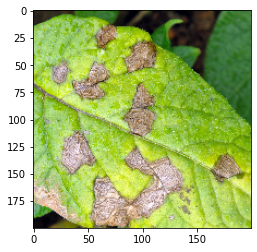

127.0.0.1 - - [16/Jul/2021 17:14:07] "POST /result.html HTTP/1.1" 200 -


Prediction: Tomato_Late_blight


127.0.0.1 - - [16/Jul/2021 17:14:07] "GET /static/potato-blight.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:14:07] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:14:09] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:14:10] "GET /static/css/style.css HTTP/1.1" 404 -


static/ca2020_early_blight_potato_damage1.png
[4.4478147e-05 7.8210026e-01 4.7176118e-06 2.8534969e-05 8.1767735e-07
 2.1766286e-01 1.3938128e-05 4.6326745e-06 4.2745241e-06 2.4898378e-05
 1.2253423e-06 4.1535837e-05 3.8570568e-05 9.0563244e-06 2.0240113e-05]


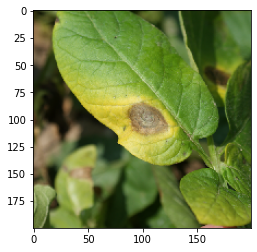

127.0.0.1 - - [16/Jul/2021 17:14:19] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:14:19] "GET /static/ca2020_early_blight_potato_damage1.png HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:14:19] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:14:25] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:14:25] "GET /static/css/style.css HTTP/1.1" 404 -


static/images (4).jpg
[4.0960513e-05 9.0531898e-01 4.0621080e-06 6.2935418e-05 2.6676599e-07
 9.4030432e-02 2.2312650e-04 4.5272550e-06 3.0330775e-05 3.5634654e-05
 2.2312617e-05 7.4801617e-05 5.4443888e-05 3.0993720e-05 6.6086272e-05]


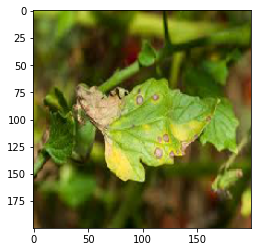

127.0.0.1 - - [16/Jul/2021 17:15:28] "POST /result.html HTTP/1.1" 200 -


Prediction: Pepper__bell___healthy


127.0.0.1 - - [16/Jul/2021 17:15:29] "GET /static/images%20%284%29.jpg HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:15:29] "GET /static/css/style.css HTTP/1.1" 404 -
127.0.0.1 - - [16/Jul/2021 17:15:31] "GET /?submit= HTTP/1.1" 200 -
127.0.0.1 - - [16/Jul/2021 17:15:31] "GET /static/css/style.css HTTP/1.1" 404 -


In [ ]:
run_with_ngrok(app)
app.run()